In [9]:
"""
FILE 1: Core Model Classes and Functions (MODIFIED v4)
====================================================
This file merges ONLY overlapping patches into groups, creating one rectangle per cluster.
Import this in your Jupyter notebook before training or inference.

Usage in Jupyter:
    %run 1_model_classes_v4.py
"""

import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from typing import List, Tuple, Dict, Optional, Union, Any
from dataclasses import dataclass
from pathlib import Path
import cv2
from PIL import Image
import faiss
from tqdm import tqdm
import json
import pickle
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')


# ==================== CONFIGURATION ====================
KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]


# ==================== DATA CLASSES ====================
@dataclass
class PatchInfo:
    """Store information about a patch"""
    image_path: str
    image_idx: int
    x: int
    y: int
    width: int
    height: int
    kernel_size: Tuple[int, int]
    embedding: Optional[np.ndarray] = None


@dataclass
class RetrievalResult:
    """Store retrieval results"""
    patch_info: PatchInfo
    similarity_score: float
    query_patch_info: Optional[Dict[str, Any]] = None


@dataclass
class MergedPatch:
    """Represents a merged patch from overlapping patches"""
    image_path: str
    x_min: int
    y_min: int
    x_max: int
    y_max: int
    width: int
    height: int
    contributing_patches: List[RetrievalResult]
    avg_score: float
    max_score: float
    kernel_sizes: List[Tuple[int, int]]


@dataclass
class ImageWithMergedPatches:
    """Represents an image with merged clusters of overlapping patches"""
    image_path: str
    merged_clusters: List[MergedPatch]  # Multiple merged rectangles per image
    all_patches: List[RetrievalResult]  # Original patches
    avg_score: float
    max_score: float
    min_score: float
    num_patches: int
    num_clusters: int
    kernel_sizes: List[Tuple[int, int]]


# ==================== MODEL WRAPPER ====================
class SatelliteModelWrapper:
    """Wrapper for satellite image models with proper DINOv3 handling."""

    def __init__(self, model_name: str = "dinov3", device: str = "cuda"):
        self.device = torch.device(device if torch.cuda.is_available() else "cpu")
        self.model_name = model_name.lower()
        self.processor = None
        self.model = None
        self.preprocess = None
        self.model, self.preprocess = self._load_model()

    def _load_model(self):
        """Load the specified satellite image model"""
        if self.model_name == "dinov2":
            model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
            model = model.to(self.device)
            model.eval()

            from torchvision import transforms
            preprocess = transforms.Compose([
                transforms.Resize(224),
                transforms.CenterCrop(224),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
            ])

        elif self.model_name == "dinov3":
            from transformers import AutoImageProcessor, AutoModel

            pretrained_model_name = "facebook/dinov3-vitb16-pretrain-lvd1689m"
            print(f"Loading DINOv3 model: {pretrained_model_name}")

            self.processor = AutoImageProcessor.from_pretrained(pretrained_model_name)
            model = AutoModel.from_pretrained(pretrained_model_name)
            model = model.to(self.device)
            model.eval()

            print(f"DINOv3 model loaded. Hidden size: {model.config.hidden_size}")

            def preprocess(image: Image.Image) -> Dict[str, torch.Tensor]:
                if image.mode != 'RGB':
                    image = image.convert('RGB')
                inputs = self.processor(images=image, return_tensors="pt")
                return inputs

            preprocess = preprocess

        else:
            raise ValueError(f"Unsupported model: {self.model_name}")

        return model, preprocess

    @torch.no_grad()
    def extract_features(self, images: Union[torch.Tensor, np.ndarray, Dict[str, torch.Tensor]]) -> np.ndarray:
        """Extract features with proper handling for all input types"""
        if self.model_name == "dinov3":
            if not isinstance(images, dict):
                raise ValueError("DINOv3 requires a dict input from the processor.")

            inputs = {k: v.to(self.device) for k, v in images.items()}
            outputs = self.model(**inputs)

            if hasattr(outputs, "last_hidden_state") and outputs.last_hidden_state is not None:
                cls_embeddings = outputs.last_hidden_state[:, 0]
                features = cls_embeddings
            elif hasattr(outputs, "pooler_output") and outputs.pooler_output is not None:
                features = outputs.pooler_output
            else:
                last = outputs.last_hidden_state
                features = last[:, 1:].mean(dim=1)

            features = torch.nn.functional.normalize(features, p=2, dim=1)
            return features.cpu().numpy()

        else:
            if isinstance(images, np.ndarray):
                images = torch.from_numpy(images).to(self.device)
            elif isinstance(images, torch.Tensor):
                images = images.to(self.device)

            features = self.model(images)

            if isinstance(features, dict):
                if 'x_norm_clstoken' in features:
                    features = features['x_norm_clstoken']
                elif 'x_norm_patchtokens' in features:
                    features = features['x_norm_patchtokens'].mean(dim=1)
                elif 'pooled' in features:
                    features = features['pooled']
                else:
                    features = features.get('last_hidden_state', features).mean(dim=1)
            else:
                if features.ndim == 4:
                    features = features.squeeze(-1).squeeze(-1)
                elif features.ndim == 2:
                    pass
                else:
                    features = features.view(features.shape[0], -1)

            if isinstance(features, torch.Tensor):
                features = torch.nn.functional.normalize(features, p=2, dim=1)

            return features.cpu().numpy()


# ==================== DATASET ====================
class FixedKernelPatchDataset(Dataset):
    """Dataset for loading patches with specific kernel size"""

    def __init__(self, image_path: str, kernel_size: Tuple[int, int],
                 stride: Tuple[int, int] = None, transform=None, min_patch_std: float = 5.0):
        self.image_path = image_path
        self.kernel_size = kernel_size
        self.stride = stride if stride else (kernel_size[0] // 2, kernel_size[1] // 2)
        self.transform = transform
        self.min_patch_std = min_patch_std

        self.image = cv2.imread(image_path)
        if self.image is None:
            raise ValueError(f"Could not load image: {image_path}")
        self.image = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        self.h, self.w = self.image.shape[:2]

        self.patches = []
        for y in range(0, max(1, self.h - kernel_size[1] + 1), self.stride[1]):
            for x in range(0, max(1, self.w - kernel_size[0] + 1), self.stride[0]):
                patch = self.image[y:y + kernel_size[1], x:x + kernel_size[0]]

                if patch.shape[0] == kernel_size[1] and patch.shape[1] == kernel_size[0]:
                    if np.std(patch) > self.min_patch_std:
                        self.patches.append((x, y))

    def __len__(self):
        return len(self.patches)

    def __getitem__(self, idx):
        x, y = self.patches[idx]
        patch = self.image[y:y + self.kernel_size[1], x:x + self.kernel_size[0]]

        if self.transform:
            pil = Image.fromarray(patch)
            transformed = self.transform(pil)
        else:
            pil = Image.fromarray(patch)
            transformed = pil

        return transformed, (x, y)


# ==================== QUERY HANDLER ====================
class QueryImageHandler:
    """Handle variable-sized query images"""

    @staticmethod
    def extract_query_patches(query_image: Union[str, np.ndarray],
                             kernel_size: Tuple[int, int],
                             stride_ratio: float = 0.5) -> List[Dict[str, Any]]:
        """Extract fixed-size patches from a query image"""
        if isinstance(query_image, str):
            img = cv2.imread(query_image)
            if img is None:
                raise ValueError(f"Could not load query image: {query_image}")
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            img = query_image.copy()

        h, w = img.shape[:2]
        patches = []

        if h < kernel_size[1] or w < kernel_size[0]:
            scale = max(kernel_size[1] / h, kernel_size[0] / w)
            new_h, new_w = int(h * scale), int(w * scale)
            img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
            h, w = new_h, new_w

        stride = (max(1, int(kernel_size[0] * (1 - stride_ratio))),
                 max(1, int(kernel_size[1] * (1 - stride_ratio))))

        patch_count = 0
        for y in range(0, max(1, h - kernel_size[1] + 1), stride[1]):
            for x in range(0, max(1, w - kernel_size[0] + 1), stride[0]):
                patch = img[y:y + kernel_size[1], x:x + kernel_size[0]]

                if patch.shape[0] == kernel_size[1] and patch.shape[1] == kernel_size[0]:
                    patches.append({
                        'image': patch,
                        'x': x,
                        'y': y,
                        'width': kernel_size[0],
                        'height': kernel_size[1],
                        'patch_id': patch_count,
                        'original_size': (h, w)
                    })
                    patch_count += 1

        if len(patches) == 0:
            center_x = max(0, (w - kernel_size[0]) // 2)
            center_y = max(0, (h - kernel_size[1]) // 2)
            patch = img[center_y:center_y + kernel_size[1], center_x:center_x + kernel_size[0]]

            if patch.shape[0] < kernel_size[1] or patch.shape[1] < kernel_size[0]:
                pad_h = max(0, kernel_size[1] - patch.shape[0])
                pad_w = max(0, kernel_size[0] - patch.shape[1])
                patch = cv2.copyMakeBorder(patch, 0, pad_h, 0, pad_w, cv2.BORDER_REFLECT)

            patches.append({
                'image': patch,
                'x': center_x,
                'y': center_y,
                'width': kernel_size[0],
                'height': kernel_size[1],
                'patch_id': 0,
                'original_size': (h, w)
            })

        return patches


# ==================== PATCH MERGER ====================
class PatchMerger:
    """Merge ONLY overlapping patches into clusters"""

    @staticmethod
    def compute_iou(patch1: Union[PatchInfo, RetrievalResult], 
                    patch2: Union[PatchInfo, RetrievalResult]) -> float:
        """Compute IoU between two patches"""
        p1 = patch1.patch_info if isinstance(patch1, RetrievalResult) else patch1
        p2 = patch2.patch_info if isinstance(patch2, RetrievalResult) else patch2

        x1_min, y1_min = p1.x, p1.y
        x1_max, y1_max = x1_min + p1.width, y1_min + p1.height

        x2_min, y2_min = p2.x, p2.y
        x2_max, y2_max = x2_min + p2.width, y2_min + p2.height

        x_inter_min = max(x1_min, x2_min)
        y_inter_min = max(y1_min, y2_min)
        x_inter_max = min(x1_max, x2_max)
        y_inter_max = min(y1_max, y2_max)

        if x_inter_max <= x_inter_min or y_inter_max <= y_inter_min:
            return 0.0

        intersection = (x_inter_max - x_inter_min) * (y_inter_max - y_inter_min)
        area1 = p1.width * p1.height
        area2 = p2.width * p2.height
        union = area1 + area2 - intersection
        return intersection / union if union > 0 else 0.0

    @staticmethod
    def merge_overlapping_patches_into_clusters(results: List[RetrievalResult], 
                                               iou_threshold: float = 0.3) -> List[MergedPatch]:
        """Merge ONLY overlapping patches into separate clusters per image"""
        image_groups = defaultdict(list)
        for result in results:
            image_groups[result.patch_info.image_path].append(result)

        all_merged_patches = []

        for img_path, img_results in image_groups.items():
            # Sort by score
            img_results.sort(key=lambda x: x.similarity_score, reverse=True)
            
            # Find overlapping clusters using Union-Find approach
            n = len(img_results)
            parent = list(range(n))
            
            def find(x):
                if parent[x] != x:
                    parent[x] = find(parent[x])
                return parent[x]
            
            def union(x, y):
                px, py = find(x), find(y)
                if px != py:
                    parent[px] = py
            
            # Check all pairs for overlap
            for i in range(n):
                for j in range(i + 1, n):
                    iou = PatchMerger.compute_iou(img_results[i], img_results[j])
                    if iou > iou_threshold:
                        union(i, j)
            
            # Group patches by cluster
            clusters = defaultdict(list)
            for i in range(n):
                root = find(i)
                clusters[root].append(img_results[i])
            
            # Create merged patch for each cluster
            for cluster_patches in clusters.values():
                x_min = min(r.patch_info.x for r in cluster_patches)
                y_min = min(r.patch_info.y for r in cluster_patches)
                x_max = max(r.patch_info.x + r.patch_info.width for r in cluster_patches)
                y_max = max(r.patch_info.y + r.patch_info.height for r in cluster_patches)

                scores = [r.similarity_score for r in cluster_patches]
                kernel_sizes = list(set(r.patch_info.kernel_size for r in cluster_patches))

                merged = MergedPatch(
                    image_path=img_path,
                    x_min=x_min,
                    y_min=y_min,
                    x_max=x_max,
                    y_max=y_max,
                    width=x_max - x_min,
                    height=y_max - y_min,
                    contributing_patches=cluster_patches,
                    avg_score=np.mean(scores),
                    max_score=np.max(scores),
                    kernel_sizes=kernel_sizes
                )
                all_merged_patches.append(merged)

        # Sort all merged patches by avg score
        all_merged_patches.sort(key=lambda x: x.avg_score, reverse=True)
        return all_merged_patches

    @staticmethod
    def group_patches_by_image_with_clusters(results: List[RetrievalResult],
                                            iou_threshold: float = 0.3) -> List[ImageWithMergedPatches]:
        """Group patches by image and create merged clusters for each image"""
        # First, get all merged patches
        all_merged = PatchMerger.merge_overlapping_patches_into_clusters(results, iou_threshold)
        
        # Group merged patches by image
        image_merged_groups = defaultdict(list)
        for merged in all_merged:
            image_merged_groups[merged.image_path].append(merged)
        
        # Group original patches by image
        image_patch_groups = defaultdict(list)
        for result in results:
            image_patch_groups[result.patch_info.image_path].append(result)
        
        images_with_merged = []
        
        for img_path, merged_clusters in image_merged_groups.items():
            all_patches = image_patch_groups[img_path]
            scores = [p.similarity_score for p in all_patches]
            kernel_sizes = list(set(p.patch_info.kernel_size for p in all_patches))
            
            image_data = ImageWithMergedPatches(
                image_path=img_path,
                merged_clusters=merged_clusters,
                all_patches=all_patches,
                avg_score=np.mean(scores),
                max_score=np.max(scores),
                min_score=np.min(scores),
                num_patches=len(all_patches),
                num_clusters=len(merged_clusters),
                kernel_sizes=kernel_sizes
            )
            images_with_merged.append(image_data)
        
        images_with_merged.sort(key=lambda x: x.avg_score, reverse=True)
        return images_with_merged

    @staticmethod
    def visualize_images_with_merged_clusters(images_with_merged: List[ImageWithMergedPatches],
                                             query_image: Union[str, np.ndarray],
                                             max_display: int = 10,
                                             save_path: Optional[str] = None):
        """Visualize images with merged clusters (one rectangle per cluster of overlapping patches)"""
        if not images_with_merged:
            print("No images to visualize")
            return

        num_display = min(max_display, len(images_with_merged))
        
        if isinstance(query_image, str):
            query_img = cv2.imread(query_image)
            query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB) if query_img is not None else np.zeros((100, 100, 3))
        else:
            query_img = query_image

        for idx, img_data in enumerate(images_with_merged[:num_display]):
            fig, axes = plt.subplots(1, 2, figsize=(16, 8))
            
            # Query image
            axes[0].imshow(query_img)
            axes[0].set_title(f"Query Image\n{query_img.shape[1]}×{query_img.shape[0]} px",
                            fontsize=12, fontweight='bold')
            axes[0].axis('off')
            
            # Result image with merged clusters
            try:
                source_img = cv2.imread(img_data.image_path)
                if source_img is not None:
                    source_img = cv2.cvtColor(source_img, cv2.COLOR_BGR2RGB)
                    
                    axes[1].imshow(source_img)
                    
                    # Draw ONE rectangle per cluster
                    colors = ['red', 'yellow', 'cyan', 'magenta', 'lime', 'orange', 'pink', 'purple']
                    for cluster_idx, merged_cluster in enumerate(img_data.merged_clusters):
                        color = colors[cluster_idx % len(colors)]
                        
                        # Score-based alpha and linewidth
                        score_normalized = (merged_cluster.avg_score - img_data.min_score) / (img_data.max_score - img_data.min_score + 1e-6)
                        alpha = 0.6 + 0.4 * score_normalized
                        linewidth = 3 + 2 * score_normalized
                        
                        rect = mpatches.Rectangle(
                            (merged_cluster.x_min, merged_cluster.y_min),
                            merged_cluster.width,
                            merged_cluster.height,
                            linewidth=linewidth,
                            edgecolor=color,
                            facecolor='none',
                            linestyle='-',
                            alpha=alpha
                        )
                        axes[1].add_patch(rect)
                        
                        # Add cluster label
                        label_text = f"C{cluster_idx+1}"
                        axes[1].text(merged_cluster.x_min + 5, merged_cluster.y_min + 20,
                                   label_text, color=color, fontsize=10, fontweight='bold',
                                   bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.5))
                    
                    title = f"Rank #{idx+1}: {Path(img_data.image_path).name}\n"
                    title += f"Avg Score: {img_data.avg_score:.3f} | Max: {img_data.max_score:.3f} | Min: {img_data.min_score:.3f}\n"
                    title += f"Total Patches: {img_data.num_patches} → Merged into {img_data.num_clusters} Cluster(s)\n"
                    title += f"Kernels: {', '.join([f'{k[0]}×{k[1]}' for k in img_data.kernel_sizes])}"
                    axes[1].set_title(title, fontsize=10, fontweight='bold')
                    axes[1].axis('off')
                    
            except Exception as e:
                print(f"Error visualizing image: {e}")
                axes[1].text(0.5, 0.5, f"Error loading image", ha='center', va='center',
                           transform=axes[1].transAxes, color='red')
                axes[1].axis('off')
            
            plt.tight_layout()
            
            if save_path:
                save_file = f"{save_path}_rank{idx+1}_{Path(img_data.image_path).stem}.png"
                plt.savefig(save_file, dpi=150, bbox_inches='tight')
                print(f"Saved: {save_file}")
            
            plt.show()

    @staticmethod
    def visualize_merged_patches(merged_patches: List[MergedPatch],
                                query_image: Union[str, np.ndarray],
                                max_display: int = 6,
                                save_path: Optional[str] = None):
        """Visualize merged patches on source images"""
        if not merged_patches:
            print("No merged patches to visualize")
            return

        num_display = min(max_display, len(merged_patches))
        fig, axes = plt.subplots(2, num_display + 1, figsize=(5 * (num_display + 1), 10))

        if axes.ndim == 1:
            axes = axes.reshape(2, -1)

        if isinstance(query_image, str):
            query_img = cv2.imread(query_image)
            query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB) if query_img is not None else np.zeros((100, 100, 3))
        else:
            query_img = query_image

        axes[0, 0].imshow(query_img)
        axes[0, 0].set_title(f"Query Image\n{query_img.shape[1]}×{query_img.shape[0]} px",
                            fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')

        axes[1, 0].text(0.5, 0.5, "Merged Clusters\n(Overlapping patches only)",
                       ha='center', va='center', transform=axes[1, 0].transAxes,
                       fontsize=11, fontweight='bold')
        axes[1, 0].axis('off')

        for idx, merged in enumerate(merged_patches[:num_display]):
            col = idx + 1

            try:
                source_img = cv2.imread(merged.image_path)
                if source_img is not None:
                    source_img = cv2.cvtColor(source_img, cv2.COLOR_BGR2RGB)
                    img_h, img_w = source_img.shape[:2]

                    axes[0, col].imshow(source_img)
                    
                    rect = mpatches.Rectangle(
                        (merged.x_min, merged.y_min),
                        merged.width,
                        merged.height,
                        linewidth=4,
                        edgecolor='red',
                        facecolor='none',
                        linestyle='-'
                    )
                    axes[0, col].add_patch(rect)

                    colors = ['yellow', 'cyan', 'magenta']
                    for i, result in enumerate(merged.contributing_patches):
                        color = colors[i % len(colors)]
                        rect_inner = mpatches.Rectangle(
                            (result.patch_info.x, result.patch_info.y),
                            result.patch_info.width,
                            result.patch_info.height,
                            linewidth=2,
                            edgecolor=color,
                            facecolor='none',
                            linestyle='--',
                            alpha=0.7
                        )
                        axes[0, col].add_patch(rect_inner)

                    title = f"Avg: {merged.avg_score:.3f} | Max: {merged.max_score:.3f}\n"
                    title += f"{Path(merged.image_path).name}\n"
                    title += f"Merged: {merged.width}×{merged.height} px"
                    axes[0, col].set_title(title, fontsize=9)
                    axes[0, col].axis('off')

                    y_start = max(0, merged.y_min)
                    y_end = min(img_h, merged.y_max)
                    x_start = max(0, merged.x_min)
                    x_end = min(img_w, merged.x_max)

                    merged_patch = source_img[y_start:y_end, x_start:x_end]

                    if merged_patch.size > 0:
                        axes[1, col].imshow(merged_patch)
                        info = f"{len(merged.contributing_patches)} patches merged\n"
                        info += f"Kernels: {', '.join([f'{k[0]}×{k[1]}' for k in merged.kernel_sizes])}"
                        axes[1, col].set_title(info, fontsize=9)
                    else:
                        axes[1, col].text(0.5, 0.5, "Empty", ha='center', va='center',
                                        transform=axes[1, col].transAxes)
                    axes[1, col].axis('off')

            except Exception as e:
                print(f"Error visualizing merged patch: {e}")
                for row in [0, 1]:
                    axes[row, col].text(0.5, 0.5, f"Error", ha='center', va='center',
                                       transform=axes[row, col].transAxes, color='red')
                    axes[row, col].axis('off')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.show()


# ==================== MULTI-KERNEL RETRIEVAL SYSTEM ====================
class MultiKernelRetrievalSystem:
    """System for comparing results across multiple kernel sizes"""

    def __init__(self,
                 model_name: str = "dinov3",
                 kernel_sizes: List[Tuple[int, int]] = KERNEL_SIZES,
                 device: str = "cuda",
                 batch_size: int = 16):
        self.model_wrapper = SatelliteModelWrapper(model_name, device)
        self.kernel_sizes = kernel_sizes
        self.batch_size = batch_size
        self.device = device
        
        self.systems = {}
        for kernel_size in kernel_sizes:
            from types import SimpleNamespace
            system = SimpleNamespace()
            system.kernel_size = kernel_size
            system.index = None
            system.patch_database = []
            system.dimension = None
            self.systems[kernel_size] = system

        self.query_handler = QueryImageHandler()
        self.patch_merger = PatchMerger()

    def _collate_fn(self, batch):
        """Collate function for dataloader"""
        patches, positions = zip(*batch)
        first = patches[0]

        if hasattr(first, 'data') and isinstance(first.data, dict):
            batched = {}
            for k in first.data.keys():
                tensors = [p.data[k] for p in patches]
                batched[k] = torch.cat(tensors, dim=0)
            return batched, list(positions)
        elif isinstance(first, dict):
            batched = {}
            for k in first.keys():
                tensors = [p[k] for p in patches]
                batched[k] = torch.cat(tensors, dim=0)
            return batched, list(positions)
        elif isinstance(first, torch.Tensor):
            batched = torch.stack(patches, dim=0)
            return batched, list(positions)
        else:
            return list(patches), list(positions)

    def process_dataset_all_kernels(self,
                                    image_paths: List[str],
                                    overlap_ratio: float = 0.5,
                                    save_prefix: Optional[str] = None):
        """Process dataset with all kernel sizes"""
        print("=" * 80)
        print(f"Processing dataset with {len(self.kernel_sizes)} kernel sizes")
        print("=" * 80)

        for kernel_size in self.kernel_sizes:
            print(f"\n{'='*60}")
            print(f"Processing with kernel size: {kernel_size[0]}×{kernel_size[1]}")
            print(f"{'='*60}")

            system = self.systems[kernel_size]
            stride = (max(1, int(kernel_size[0] * (1 - overlap_ratio))),
                     max(1, int(kernel_size[1] * (1 - overlap_ratio))))

            all_embeddings = []

            for img_idx, img_path in enumerate(tqdm(image_paths, desc=f"Processing {kernel_size}")):
                try:
                    if self.model_wrapper.model_name == "dinov3":
                        transform = lambda pil: self.model_wrapper.preprocess(pil)
                    else:
                        transform = self.model_wrapper.preprocess

                    dataset = FixedKernelPatchDataset(
                        img_path,
                        kernel_size=kernel_size,
                        stride=stride,
                        transform=transform,
                        min_patch_std=5.0
                    )

                    if len(dataset) == 0:
                        continue

                    dataloader = DataLoader(
                        dataset,
                        batch_size=self.batch_size,
                        shuffle=False,
                        num_workers=2,
                        collate_fn=self._collate_fn
                    )

                    for batch_patches, positions in dataloader:
                        try:
                            embeddings = self.model_wrapper.extract_features(batch_patches)

                            for emb, (x, y) in zip(embeddings, positions):
                                patch_info = PatchInfo(
                                    image_path=img_path,
                                    image_idx=img_idx,
                                    x=int(x),
                                    y=int(y),
                                    width=kernel_size[0],
                                    height=kernel_size[1],
                                    kernel_size=kernel_size,
                                    embedding=emb
                                )
                                system.patch_database.append(patch_info)
                                all_embeddings.append(emb)
                        except Exception as e:
                            print(f"Error processing batch: {e}")
                            continue

                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
                    continue

            if not all_embeddings:
                print(f"Warning: No patches extracted for kernel size {kernel_size}")
                continue

            all_embeddings = np.array(all_embeddings).astype('float32')
            system.dimension = all_embeddings.shape[1]

            print(f"Building index: {len(all_embeddings)} patches, dim {system.dimension}")
            system.index = faiss.IndexFlatIP(system.dimension)
            system.index.add(all_embeddings)

            if save_prefix:
                save_path = f"{save_prefix}_k{kernel_size[0]}x{kernel_size[1]}"
                faiss.write_index(system.index, f"{save_path}_faiss.index")
                with open(f"{save_path}_patches.pkl", 'wb') as f:
                    pickle.dump(system.patch_database, f)
                
                metadata = {
                    'kernel_size': kernel_size,
                    'num_patches': len(system.patch_database),
                    'dimension': system.dimension
                }
                with open(f"{save_path}_metadata.json", 'w') as f:
                    json.dump(metadata, f)
                
                print(f"Saved index for kernel {kernel_size}")

            print(f"✅ Completed: {len(system.patch_database)} patches")

    def load_saved_indexes(self, index_prefix: str):
        """Load pre-computed indexes from disk"""
        print(f"\n📂 Loading pre-computed indexes from: {index_prefix}")
        
        for kernel_size in self.kernel_sizes:
            index_path = f"{index_prefix}_k{kernel_size[0]}x{kernel_size[1]}"
            try:
                self.systems[kernel_size].index = faiss.read_index(f"{index_path}_faiss.index")
                
                with open(f"{index_path}_patches.pkl", 'rb') as f:
                    self.systems[kernel_size].patch_database = pickle.load(f)
                
                with open(f"{index_path}_metadata.json", 'r') as f:
                    metadata = json.load(f)
                    self.systems[kernel_size].dimension = metadata['dimension']
                
                print(f"  ✓ Loaded kernel {kernel_size[0]}×{kernel_size[1]}: "
                      f"{len(self.systems[kernel_size].patch_database)} patches")
            
            except Exception as e:
                print(f"  ✗ Failed to load kernel {kernel_size[0]}×{kernel_size[1]}: {e}")

    def search_all_kernels(self,
                          query_image: Union[str, np.ndarray],
                          top_k: int = 20,
                          query_stride_ratio: float = 0.5,
                          aggregation: str = "max") -> Dict[Tuple[int, int], List[RetrievalResult]]:
        """Search with all kernel sizes"""
        all_results = {}

        print(f"\n{'='*80}")
        print("Searching with all kernel sizes")
        print(f"{'='*80}")

        for kernel_size in self.kernel_sizes:
            print(f"\n🔍 Searching with kernel {kernel_size[0]}×{kernel_size[1]}...")
            
            system = self.systems[kernel_size]
            if system.index is None:
                print(f"  ⚠️  Index not built for {kernel_size}")
                continue

            query_patches = self.query_handler.extract_query_patches(
                query_image,
                kernel_size=kernel_size,
                stride_ratio=query_stride_ratio
            )

            all_matches = defaultdict(lambda: {'scores': [], 'query_patches': []})

            for patch_info in query_patches:
                patch_img = patch_info['image']

                if self.model_wrapper.model_name == "dinov3":
                    pil_img = Image.fromarray(patch_img)
                    inputs = self.model_wrapper.preprocess(pil_img)
                    if hasattr(inputs, 'data'):
                        processed_inputs = inputs.data
                    else:
                        processed_inputs = inputs
                    embedding = self.model_wrapper.extract_features(processed_inputs)
                else:
                    pil_img = Image.fromarray(patch_img)
                    img_tensor = self.model_wrapper.preprocess(pil_img).unsqueeze(0)
                    embedding = self.model_wrapper.extract_features(img_tensor)

                embedding = embedding.flatten().reshape(1, -1).astype('float32')
                similarities, indices = system.index.search(embedding, top_k * 2)

                for sim, idx in zip(similarities[0], indices[0]):
                    if idx != -1:
                        all_matches[idx]['scores'].append(float(sim))
                        all_matches[idx]['query_patches'].append(patch_info)

            results = []
            for idx, data in all_matches.items():
                if aggregation == "max":
                    final_score = max(data['scores'])
                elif aggregation == "mean":
                    final_score = np.mean(data['scores'])
                else:
                    final_score = max(data['scores'])

                patch_info = system.patch_database[idx]
                result = RetrievalResult(
                    patch_info=patch_info,
                    similarity_score=final_score,
                    query_patch_info={'num_matches': len(data['scores'])}
                )
                results.append(result)

            results.sort(key=lambda x: x.similarity_score, reverse=True)
            results = results[:top_k]
            all_results[kernel_size] = results

            print(f"  ✅ Found {len(results)} results. Top score: {results[0].similarity_score:.4f}" if results else "  No results")

        return all_results

    def visualize_separate_kernel_results(self,
                                         all_results: Dict[Tuple[int, int], List[RetrievalResult]],
                                         query_image: Union[str, np.ndarray],
                                         num_display: int = 5,
                                         save_prefix: Optional[str] = None):
        """Visualize results separately for each kernel size"""
        print(f"\n{'='*80}")
        print("Creating separate visualizations for each kernel size")
        print(f"{'='*80}")

        if isinstance(query_image, str):
            query_img = cv2.imread(query_image)
            query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB) if query_img is not None else np.zeros((100, 100, 3))
        else:
            query_img = query_image

        for kernel_size, results in all_results.items():
            if not results:
                continue

            print(f"\n📊 Visualizing kernel {kernel_size[0]}×{kernel_size[1]}")
            
            num_show = min(num_display, len(results))
            fig, axes = plt.subplots(2, num_show + 1, figsize=(4 * (num_show + 1), 8))

            if axes.ndim == 1:
                axes = axes.reshape(2, -1)

            axes[0, 0].imshow(query_img)
            axes[0, 0].set_title(f"Query Image\nKernel: {kernel_size[0]}×{kernel_size[1]}",
                                fontsize=11, fontweight='bold')
            axes[0, 0].axis('off')

            axes[1, 0].text(0.5, 0.5, f"Matched Patches\n{kernel_size[0]}×{kernel_size[1]} px",
                           ha='center', va='center', transform=axes[1, 0].transAxes,
                           fontsize=10, fontweight='bold')
            axes[1, 0].axis('off')

            for idx, result in enumerate(results[:num_show]):
                col = idx + 1

                try:
                    full_img = cv2.imread(result.patch_info.image_path)
                    if full_img is not None:
                        full_img = cv2.cvtColor(full_img, cv2.COLOR_BGR2RGB)
                        img_h, img_w = full_img.shape[:2]

                        axes[0, col].imshow(full_img)
                        rect = mpatches.Rectangle(
                            (result.patch_info.x, result.patch_info.y),
                            result.patch_info.width,
                            result.patch_info.height,
                            linewidth=3,
                            edgecolor='red',
                            facecolor='none'
                        )
                        axes[0, col].add_patch(rect)
                        axes[0, col].set_title(f"Score: {result.similarity_score:.3f}\n{Path(result.patch_info.image_path).name}",
                                              fontsize=9)
                        axes[0, col].axis('off')

                        y_start = max(0, result.patch_info.y)
                        y_end = min(img_h, result.patch_info.y + result.patch_info.height)
                        x_start = max(0, result.patch_info.x)
                        x_end = min(img_w, result.patch_info.x + result.patch_info.width)
                        patch = full_img[y_start:y_end, x_start:x_end]

                        if patch.size > 0:
                            axes[1, col].imshow(patch)
                            axes[1, col].set_title(f"({result.patch_info.x},{result.patch_info.y})",
                                                  fontsize=8)
                        axes[1, col].axis('off')

                except Exception as e:
                    for row in [0, 1]:
                        axes[row, col].text(0.5, 0.5, "Error", ha='center', va='center',
                                           transform=axes[row, col].transAxes, color='red')
                        axes[row, col].axis('off')

            plt.tight_layout()
            plt.show()

    def visualize_combined_all_kernels(self,
                                      all_results: Dict[Tuple[int, int], List[RetrievalResult]],
                                      query_image: Union[str, np.ndarray],
                                      num_display_per_kernel: int = 3,
                                      save_path: Optional[str] = None):
        """Visualize all kernel results in one combined figure"""
        print(f"\n{'='*80}")
        print("Creating COMBINED visualization with all kernel sizes")
        print(f"{'='*80}")

        if isinstance(query_image, str):
            query_img = cv2.imread(query_image)
            query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB) if query_img is not None else np.zeros((100, 100, 3))
        else:
            query_img = query_image

        num_kernels = len(all_results)
        fig = plt.figure(figsize=(20, 6 * num_kernels))
        gs = fig.add_gridspec(num_kernels, num_display_per_kernel + 2, 
                             hspace=0.3, wspace=0.3)

        fig.suptitle('Multi-Kernel Retrieval Results Comparison', 
                    fontsize=16, fontweight='bold', y=0.995)

        ax_query = fig.add_subplot(gs[:, 0])
        ax_query.imshow(query_img)
        ax_query.set_title(f"Query Image\n{query_img.shape[1]}×{query_img.shape[0]} px",
                          fontsize=14, fontweight='bold')
        ax_query.axis('off')

        kernel_colors = {
            (75, 75): 'cyan',
            (85, 85): 'yellow',
            (95, 95): 'magenta'
        }

        row_idx = 0
        for kernel_size, results in sorted(all_results.items()):
            if not results:
                row_idx += 1
                continue

            ax_label = fig.add_subplot(gs[row_idx, 1])
            label_text = f"Kernel Size:\n{kernel_size[0]}×{kernel_size[1]} px\n\n"
            label_text += f"Top Score:\n{results[0].similarity_score:.3f}\n\n"
            label_text += f"Results:\n{len(results)}"
            ax_label.text(0.5, 0.5, label_text, ha='center', va='center',
                         fontsize=12, fontweight='bold',
                         bbox=dict(boxstyle='round', facecolor=kernel_colors.get(kernel_size, 'lightgray'), alpha=0.3))
            ax_label.axis('off')

            for idx in range(num_display_per_kernel):
                col = idx + 2
                
                if idx < len(results):
                    result = results[idx]
                    ax = fig.add_subplot(gs[row_idx, col])

                    try:
                        full_img = cv2.imread(result.patch_info.image_path)
                        if full_img is not None:
                            full_img = cv2.cvtColor(full_img, cv2.COLOR_BGR2RGB)

                            ax.imshow(full_img)
                            rect = mpatches.Rectangle(
                                (result.patch_info.x, result.patch_info.y),
                                result.patch_info.width,
                                result.patch_info.height,
                                linewidth=4,
                                edgecolor=kernel_colors.get(kernel_size, 'red'),
                                facecolor='none'
                            )
                            ax.add_patch(rect)
                            
                            title = f"#{idx+1}: {result.similarity_score:.3f}\n"
                            title += f"{Path(result.patch_info.image_path).name}\n"
                            title += f"({result.patch_info.x},{result.patch_info.y})"
                            ax.set_title(title, fontsize=9)
                        else:
                            ax.text(0.5, 0.5, "Image Not Found", ha='center', va='center',
                                   transform=ax.transAxes, color='red')
                    except Exception as e:
                        ax.text(0.5, 0.5, f"Error", ha='center', va='center',
                               transform=ax.transAxes, color='red', fontsize=8)
                    
                    ax.axis('off')
                else:
                    ax = fig.add_subplot(gs[row_idx, col])
                    ax.axis('off')

            row_idx += 1

        plt.show()

    def merge_and_visualize_clustered_patches(self,
                                             all_results: Dict[Tuple[int, int], List[RetrievalResult]],
                                             query_image: Union[str, np.ndarray],
                                             iou_threshold: float = 0.3,
                                             max_display: int = 10,
                                             save_path: Optional[str] = None):
        """Merge ONLY overlapping patches into clusters and visualize"""
        print(f"\n{'='*80}")
        print("MERGING OVERLAPPING PATCHES INTO CLUSTERS")
        print(f"{'='*80}")

        all_combined_results = []
        for kernel_size, results in all_results.items():
            all_combined_results.extend(results)

        print(f"Total patches across all kernels: {len(all_combined_results)}")

        images_with_merged = self.patch_merger.group_patches_by_image_with_clusters(
            all_combined_results, 
            iou_threshold=iou_threshold
        )

        print(f"Found {len(images_with_merged)} unique images")
        
        total_clusters = sum(img.num_clusters for img in images_with_merged)
        print(f"Total merged clusters: {total_clusters}")
        
        print(f"\n📊 Images with Merged Clusters Summary:")
        for i, img_data in enumerate(images_with_merged[:10], 1):
            kernels_str = ', '.join([f"{k[0]}×{k[1]}" for k in img_data.kernel_sizes])
            print(f"  {i}. {Path(img_data.image_path).name}")
            print(f"     Patches: {img_data.num_patches} → Merged into {img_data.num_clusters} cluster(s)")
            print(f"     Scores: avg={img_data.avg_score:.3f}, max={img_data.max_score:.3f}")
            print(f"     Kernels: {kernels_str}")

        self.patch_merger.visualize_images_with_merged_clusters(
            images_with_merged,
            query_image,
            max_display=max_display,
            save_path=save_path
        )

        return images_with_merged


print("✅ Modified model classes v4 loaded successfully!")
print(f"   Available kernel sizes: {KERNEL_SIZES}")
print(f"   NEW: merge_and_visualize_clustered_patches() - Merges ONLY overlapping patches!")
print(f"   Shows multiple rectangles per image (one per cluster)!")
print(f"   Ready for training and inference!")

✅ Modified model classes v4 loaded successfully!
   Available kernel sizes: [(75, 75), (85, 85), (95, 95)]
   NEW: merge_and_visualize_clustered_patches() - Merges ONLY overlapping patches!
   Shows multiple rectangles per image (one per cluster)!
   Ready for training and inference!


In [5]:
"""
FILE 2: Training Script
========================
This file trains the multi-kernel retrieval system on your dataset.
Run this after importing the model classes from File 1.

Usage in Jupyter:
    1. First run: %run 1_model_classes_v3.py
    2. Then execute the cells below
"""

from pathlib import Path
import torch

# ==================== CONFIGURATION ====================
# Update these paths for your setup
DATASET_PATH = "/home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder"
INDEX_SAVE_PREFIX = "multi_kernel_index"

# Training parameters
OVERLAP_RATIO = 0.6  # 50% overlap between patches
BATCH_SIZE = 16
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "dinov3"  # or "dinov2"

# Kernel sizes to train (you can modify these)
TRAIN_KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]

print("=" * 80)
print("MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - TRAINING")
print("=" * 80)
print(f"Dataset Path: {DATASET_PATH}")
print(f"Device: {DEVICE}")
print(f"Model: {MODEL_NAME}")
print(f"Kernel Sizes: {TRAIN_KERNEL_SIZES}")
print(f"Overlap Ratio: {OVERLAP_RATIO}")
print(f"Batch Size: {BATCH_SIZE}")
print("=" * 80)


# ==================== STEP 1: PREPARE DATASET ====================
print("\n" + "=" * 80)
print("STEP 1: Preparing Dataset")
print("=" * 80)

dataset_path = Path(DATASET_PATH)
dataset_images = sorted(list(dataset_path.glob("*.jpg")))

print(f"Found {len(dataset_images)} images in dataset")
print(f"First few images: {[img.name for img in dataset_images[:3]]}")

# Convert to string paths
dataset_image_paths = [str(img) for img in dataset_images]

if len(dataset_image_paths) == 0:
    raise ValueError(f"No images found in {DATASET_PATH}. Please check the path!")


# ==================== STEP 2: INITIALIZE SYSTEM ====================
print("\n" + "=" * 80)
print("STEP 2: Initializing Multi-Kernel Retrieval System")
print("=" * 80)

system = MultiKernelRetrievalSystem(
    model_name=MODEL_NAME,
    kernel_sizes=TRAIN_KERNEL_SIZES,
    device=DEVICE,
    batch_size=BATCH_SIZE
)

print("✅ System initialized successfully!")
print(f"   - Model: {MODEL_NAME}")
print(f"   - Number of kernel sizes: {len(TRAIN_KERNEL_SIZES)}")
print(f"   - Device: {DEVICE}")


# ==================== STEP 3: PROCESS DATASET & BUILD INDEXES ====================
print("\n" + "=" * 80)
print("STEP 3: Processing Dataset and Building Indexes")
print("=" * 80)
print("This will create separate FAISS indexes for each kernel size...")
print("This may take several minutes depending on dataset size.\n")

system.process_dataset_all_kernels(
    image_paths=dataset_image_paths,
    overlap_ratio=OVERLAP_RATIO,
    save_prefix=INDEX_SAVE_PREFIX
)


# ==================== STEP 4: VERIFY SAVED INDEXES ====================
print("\n" + "=" * 80)
print("STEP 4: Verifying Saved Indexes")
print("=" * 80)

saved_files = []
for kernel_size in TRAIN_KERNEL_SIZES:
    prefix = f"{INDEX_SAVE_PREFIX}_k{kernel_size[0]}x{kernel_size[1]}"
    
    faiss_file = f"{prefix}_faiss.index"
    pkl_file = f"{prefix}_patches.pkl"
    meta_file = f"{prefix}_metadata.json"
    
    if Path(faiss_file).exists() and Path(pkl_file).exists() and Path(meta_file).exists():
        saved_files.append(kernel_size)
        print(f"✅ Kernel {kernel_size[0]}×{kernel_size[1]}: All files saved")
        print(f"   - FAISS index: {faiss_file}")
        print(f"   - Patches DB: {pkl_file}")
        print(f"   - Metadata: {meta_file}")
    else:
        print(f"❌ Kernel {kernel_size[0]}×{kernel_size[1]}: Missing files!")

print(f"\n{'=' * 80}")
print("TRAINING SUMMARY")
print(f"{'=' * 80}")
print(f"✅ Successfully trained {len(saved_files)}/{len(TRAIN_KERNEL_SIZES)} kernel sizes")
print(f"✅ Indexes saved with prefix: {INDEX_SAVE_PREFIX}")
print(f"\nYou can now run the inference script (File 3) to query these indexes!")
print("=" * 80)


# ==================== OPTIONAL: QUICK STATS ====================
print("\n" + "=" * 80)
print("INDEX STATISTICS")
print("=" * 80)

for kernel_size in TRAIN_KERNEL_SIZES:
    system_kernel = system.systems[kernel_size]
    if system_kernel.index is not None:
        num_patches = len(system_kernel.patch_database)
        dimension = system_kernel.dimension
        print(f"\nKernel {kernel_size[0]}×{kernel_size[1]}:")
        print(f"  - Total patches indexed: {num_patches}")
        print(f"  - Embedding dimension: {dimension}")
        print(f"  - Average patches per image: {num_patches / len(dataset_image_paths):.1f}")

print("\n" + "=" * 80)
print("Training complete! Indexes are ready for querying.")
print("=" * 80)

MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - TRAINING
Dataset Path: /home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder
Device: cuda
Model: dinov3
Kernel Sizes: [(75, 75), (85, 85), (95, 95)]
Overlap Ratio: 0.6
Batch Size: 16

STEP 1: Preparing Dataset
Found 9 images in dataset
First few images: ['0*iRgiB6y8atMchG0o.jpg', 'GC01PS03D0001.jpg', 'GC01PS03D0002.jpg']

STEP 2: Initializing Multi-Kernel Retrieval System
Loading DINOv3 model: facebook/dinov3-vitb16-pretrain-lvd1689m
DINOv3 model loaded. Hidden size: 768
✅ System initialized successfully!
   - Model: dinov3
   - Number of kernel sizes: 3
   - Device: cuda

STEP 3: Processing Dataset and Building Indexes
This will create separate FAISS indexes for each kernel size...
This may take several minutes depending on dataset size.

Processing dataset with 3 kernel sizes

Processing with kernel size: 75×75


Processing (75, 75):   0%|          | 0/9 [00:00<?, ?it/s]

Processing (75, 75): 100%|██████████| 9/9 [00:51<00:00,  5.76s/it]


Building index: 21510 patches, dim 768
Saved index for kernel (75, 75)
✅ Completed: 21510 patches

Processing with kernel size: 85×85


Processing (85, 85): 100%|██████████| 9/9 [00:41<00:00,  4.60s/it]


Building index: 16533 patches, dim 768
Saved index for kernel (85, 85)
✅ Completed: 16533 patches

Processing with kernel size: 95×95


Processing (95, 95): 100%|██████████| 9/9 [00:33<00:00,  3.76s/it]


Building index: 13249 patches, dim 768
Saved index for kernel (95, 95)
✅ Completed: 13249 patches

STEP 4: Verifying Saved Indexes
✅ Kernel 75×75: All files saved
   - FAISS index: multi_kernel_index_k75x75_faiss.index
   - Patches DB: multi_kernel_index_k75x75_patches.pkl
   - Metadata: multi_kernel_index_k75x75_metadata.json
✅ Kernel 85×85: All files saved
   - FAISS index: multi_kernel_index_k85x85_faiss.index
   - Patches DB: multi_kernel_index_k85x85_patches.pkl
   - Metadata: multi_kernel_index_k85x85_metadata.json
✅ Kernel 95×95: All files saved
   - FAISS index: multi_kernel_index_k95x95_faiss.index
   - Patches DB: multi_kernel_index_k95x95_patches.pkl
   - Metadata: multi_kernel_index_k95x95_metadata.json

TRAINING SUMMARY
✅ Successfully trained 3/3 kernel sizes
✅ Indexes saved with prefix: multi_kernel_index

You can now run the inference script (File 3) to query these indexes!

INDEX STATISTICS

Kernel 75×75:
  - Total patches indexed: 21510
  - Embedding dimension: 768
  -

MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - CLUSTERED MERGING (v4)
Query Image: 02.png
Index Prefix: multi_kernel_index
Device: cuda
Top K: 50
IoU Threshold: 0.3
Kernel Sizes: [(75, 75), (85, 85), (95, 95)]

STEP 1: Loading Query Image
✅ Query image loaded: 02.png
   - Size: 60×66 px
   - Mode: RGBA
   - Using original query (no compression)

STEP 2: Initializing Multi-Kernel System
Loading DINOv3 model: facebook/dinov3-vitb16-pretrain-lvd1689m
DINOv3 model loaded. Hidden size: 768
✅ System initialized

STEP 3: Loading Pre-trained Indexes

📂 Loading pre-computed indexes from: multi_kernel_index
  ✓ Loaded kernel 75×75: 21510 patches
  ✓ Loaded kernel 85×85: 16533 patches
  ✓ Loaded kernel 95×95: 13249 patches

STEP 4: Searching with All Kernel Sizes

Searching with all kernel sizes

🔍 Searching with kernel 75×75...
  ✅ Found 50 results. Top score: 0.8296

🔍 Searching with kernel 85×85...
  ✅ Found 50 results. Top score: 0.8552

🔍 Searching with kernel 95×95...
  ✅ Found 50 results. Top sc

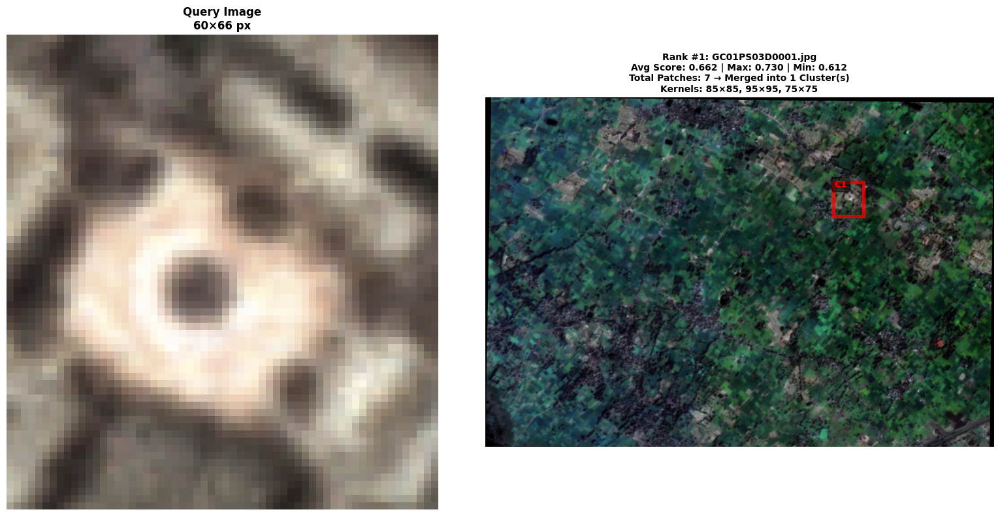

Saved: clustered_02_rank2_GC01PS03D0002.png


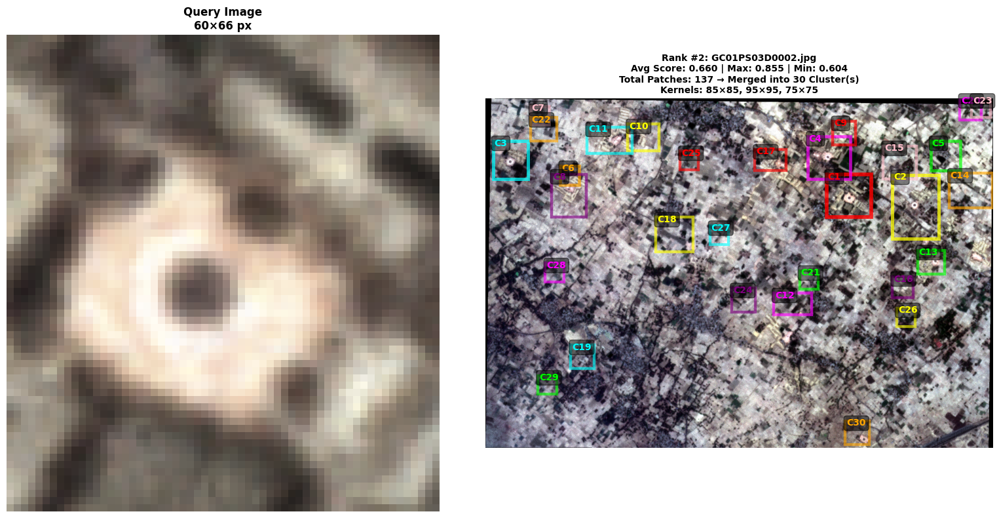

Saved: clustered_02_rank3_GC01PS03D0011_jpg.rf.7401fbc92032dc0063669b87365befa1.png


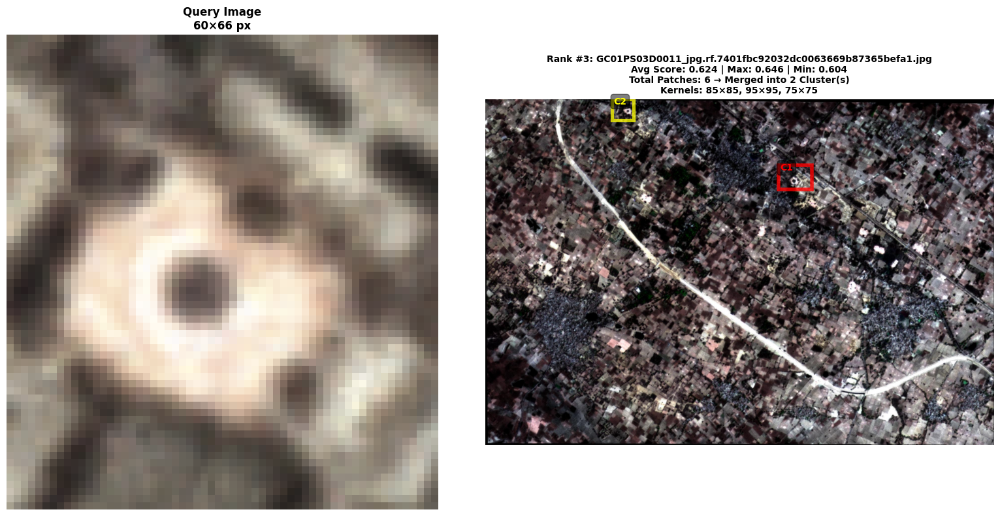

✅ Displayed top 3 images with merged clusters

QUERY COMPLETE!
Query image: 02.png
Total matches found: 150
Unique images found: 3
Total patches: 150 → Merged into 33 clusters

Top 5 Images (by Avg Score) with Merged Clusters:
  1. GC01PS03D0001.jpg
     - Patches: 7 → 1 cluster(s)
     - Avg Score: 0.662, Max: 0.730
       Cluster 1: 121×135 px (7 patches, avg score: 0.662)
  2. GC01PS03D0002.jpg
     - Patches: 137 → 30 cluster(s)
     - Avg Score: 0.660, Max: 0.855
       Cluster 1: 179×171 px (20 patches, avg score: 0.739)
       Cluster 2: 187×255 px (27 patches, avg score: 0.681)
       Cluster 3: 141×153 px (13 patches, avg score: 0.674)
       Cluster 4: 171×171 px (14 patches, avg score: 0.652)
       Cluster 5: 119×119 px (5 patches, avg score: 0.647)
       Cluster 6: 75×75 px (1 patches, avg score: 0.643)
       Cluster 7: 75×75 px (1 patches, avg score: 0.636)
       Cluster 8: 139×171 px (8 patches, avg score: 0.632)
       Cluster 9: 91×97 px (2 patches, avg score: 0.631

In [12]:
"""
FILE 3: Query and Visualization Script (MODIFIED v4)
==================================================
This file loads pre-trained indexes and merges ONLY overlapping patches into clusters.
Run this after training (File 2).

NEW FEATURE: Shows one rectangle per CLUSTER of overlapping patches (not one giant box).

Usage in Jupyter:
    1. First run: %run 1_model_classes_v4.py
    2. Then execute the cells below
"""

from pathlib import Path
from PIL import Image
import torch

# ==================== CONFIGURATION ====================
# Update these paths for your setup
QUERY_IMAGE_PATH = "/home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder/02.png"
INDEX_PREFIX = "multi_kernel_index"

# Query parameters
COMPRESS_QUERY = False  # Set True to compress query image before searching
COMPRESSION_SIZE = (50, 50)  # Target size if compressing
TOP_K = 50  # Number of results to retrieve per kernel
MERGE_IOU_THRESHOLD = 0.3  # IoU threshold for merging overlapping patches into clusters
QUERY_STRIDE_RATIO = 0.3  # Overlap ratio for query patch extraction

# Visualization options
VISUALIZE_SEPARATE = False  # Show results separately for each kernel
VISUALIZE_COMBINED = False  # Show all kernels in one figure
VISUALIZE_CLUSTERED = True  # NEW: Show merged clusters (one rectangle per overlapping group)

# Display settings
MAX_IMAGES_TO_DISPLAY = 10  # Number of top images to show

# Kernel sizes (must match training)
QUERY_KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]

# Device
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "dinov3"

print("=" * 80)
print("MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - CLUSTERED MERGING (v4)")
print("=" * 80)
print(f"Query Image: {Path(QUERY_IMAGE_PATH).name}")
print(f"Index Prefix: {INDEX_PREFIX}")
print(f"Device: {DEVICE}")
print(f"Top K: {TOP_K}")
print(f"IoU Threshold: {MERGE_IOU_THRESHOLD}")
print(f"Kernel Sizes: {QUERY_KERNEL_SIZES}")
print("=" * 80)


# ==================== STEP 1: VERIFY QUERY IMAGE ====================
print("\n" + "=" * 80)
print("STEP 1: Loading Query Image")
print("=" * 80)

query_path = Path(QUERY_IMAGE_PATH)
if not query_path.exists():
    raise FileNotFoundError(f"Query image not found: {QUERY_IMAGE_PATH}")

with Image.open(QUERY_IMAGE_PATH) as img:
    query_size = img.size
    print(f"✅ Query image loaded: {query_path.name}")
    print(f"   - Size: {query_size[0]}×{query_size[1]} px")
    print(f"   - Mode: {img.mode}")

# Optional compression
if COMPRESS_QUERY:
    compressed_path = str(query_path).replace(
        query_path.suffix, 
        f"_compressed_{COMPRESSION_SIZE[0]}x{COMPRESSION_SIZE[1]}{query_path.suffix}"
    )
    
    with Image.open(QUERY_IMAGE_PATH) as img:
        img_resized = img.resize(COMPRESSION_SIZE, Image.Resampling.LANCZOS)
        img_resized.save(compressed_path)
    
    print(f"✅ Compressed query saved: {Path(compressed_path).name}")
    print(f"   - New size: {COMPRESSION_SIZE[0]}×{COMPRESSION_SIZE[1]} px")
    final_query_path = compressed_path
else:
    final_query_path = QUERY_IMAGE_PATH
    print(f"   - Using original query (no compression)")


# ==================== STEP 2: INITIALIZE SYSTEM ====================
print("\n" + "=" * 80)
print("STEP 2: Initializing Multi-Kernel System")
print("=" * 80)

system = MultiKernelRetrievalSystem(
    model_name=MODEL_NAME,
    kernel_sizes=QUERY_KERNEL_SIZES,
    device=DEVICE,
    batch_size=16
)

print("✅ System initialized")


# ==================== STEP 3: LOAD PRE-TRAINED INDEXES ====================
print("\n" + "=" * 80)
print("STEP 3: Loading Pre-trained Indexes")
print("=" * 80)

system.load_saved_indexes(INDEX_PREFIX)


# ==================== STEP 4: SEARCH WITH ALL KERNELS ====================
print("\n" + "=" * 80)
print("STEP 4: Searching with All Kernel Sizes")
print("=" * 80)

all_results = system.search_all_kernels(
    query_image=final_query_path,
    top_k=TOP_K,
    query_stride_ratio=QUERY_STRIDE_RATIO,
    aggregation="max"
)

# Print summary
print("\n📊 Search Results Summary:")
total_results = 0
for kernel_size, results in all_results.items():
    if results:
        total_results += len(results)
        print(f"  Kernel {kernel_size[0]}×{kernel_size[1]}: {len(results)} matches")
        print(f"    Top-3 scores: {[f'{r.similarity_score:.3f}' for r in results[:3]]}")

if total_results == 0:
    print("⚠️  No results found! Check if indexes were loaded correctly.")
    import sys
    sys.exit(1)


# ==================== STEP 5a: NEW - VISUALIZE WITH MERGED CLUSTERS ====================
if VISUALIZE_CLUSTERED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5a: NEW - Visualizing Merged Clusters (Overlapping Patches Only)")
    print("=" * 80)
    
    images_with_clusters = system.merge_and_visualize_clustered_patches(
        all_results,
        query_image=final_query_path,
        iou_threshold=MERGE_IOU_THRESHOLD,
        max_display=MAX_IMAGES_TO_DISPLAY,
        save_path=f"clustered_{Path(final_query_path).stem}"
    )
    
    print(f"✅ Displayed top {min(MAX_IMAGES_TO_DISPLAY, len(images_with_clusters))} images with merged clusters")


# ==================== STEP 5b: VISUALIZE SEPARATE RESULTS (OPTIONAL) ====================
if VISUALIZE_SEPARATE and all_results:
    print("\n" + "=" * 80)
    print("STEP 5b: Visualizing Separate Results for Each Kernel")
    print("=" * 80)
    
    system.visualize_separate_kernel_results(
        all_results,
        query_image=final_query_path,
        num_display=5,
        save_prefix=f"results_{Path(final_query_path).stem}"
    )
    
    print("✅ Separate visualizations displayed")


# ==================== STEP 5c: VISUALIZE COMBINED RESULTS (OPTIONAL) ====================
if VISUALIZE_COMBINED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5c: Visualizing Combined Results (All Kernels)")
    print("=" * 80)
    
    system.visualize_combined_all_kernels(
        all_results,
        query_image=final_query_path,
        num_display_per_kernel=5,
        save_path=f"combined_all_kernels_{Path(final_query_path).stem}.png"
    )
    
    print("✅ Combined visualization displayed")


# Store results
query_results = {
    'all_results': all_results,
    'images_with_clusters': images_with_clusters if VISUALIZE_CLUSTERED else None,
    'query_path': final_query_path
}


# ==================== FINAL SUMMARY ====================
print("\n" + "=" * 80)
print("QUERY COMPLETE!")
print("=" * 80)
print(f"Query image: {Path(final_query_path).name}")
print(f"Total matches found: {sum(len(r) for r in all_results.values())}")

if VISUALIZE_CLUSTERED and 'images_with_clusters' in query_results:
    images_data = query_results['images_with_clusters']
    if images_data:
        print(f"Unique images found: {len(images_data)}")
        total_patches = sum(img.num_patches for img in images_data)
        total_clusters = sum(img.num_clusters for img in images_data)
        print(f"Total patches: {total_patches} → Merged into {total_clusters} clusters")
        
        print(f"\nTop 5 Images (by Avg Score) with Merged Clusters:")
        for i, img_data in enumerate(images_data[:5], 1):
            print(f"  {i}. {Path(img_data.image_path).name}")
            print(f"     - Patches: {img_data.num_patches} → {img_data.num_clusters} cluster(s)")
            print(f"     - Avg Score: {img_data.avg_score:.3f}, Max: {img_data.max_score:.3f}")
            
            # Show cluster details
            for cidx, cluster in enumerate(img_data.merged_clusters, 1):
                print(f"       Cluster {cidx}: {cluster.width}×{cluster.height} px "
                      f"({len(cluster.contributing_patches)} patches, "
                      f"avg score: {cluster.avg_score:.3f})")

print("\n" + "=" * 80)
print("All visualizations displayed!")
print("Results stored in 'query_results' variable for further analysis.")
print("=" * 80)


# ==================== OPTIONAL: ACCESS INDIVIDUAL RESULTS ====================
print("\n" + "=" * 80)
print("ACCESSING RESULTS")
print("=" * 80)
print("\nYou can access results using:")
print("  - query_results['all_results']: Dictionary of results per kernel")
print("  - query_results['images_with_clusters']: List of images with merged clusters")
print("  - query_results['query_path']: Path to query image used")
print("\nExample - Access images sorted by avg score:")
print("  images = query_results['images_with_clusters']")
print("  if images:")
print("      top_image = images[0]")
print("      print(f'Top image: {top_image.image_path}')")
print("      print(f'Avg score: {top_image.avg_score:.3f}')")
print("      print(f'Number of clusters: {top_image.num_clusters}')")
print("      for cluster in top_image.merged_clusters:")
print("          print(f'  Cluster: {cluster.width}×{cluster.height} px')")
print("\nExample - Get all clusters for top image:")
print("  if images:")
print("      for cidx, cluster in enumerate(images[0].merged_clusters, 1):")
print("          print(f'Cluster {cidx}:')")
print("          print(f'  BBox: ({cluster.x_min}, {cluster.y_min}) to ({cluster.x_max}, {cluster.y_max})')")
print("          print(f'  Patches in cluster: {len(cluster.contributing_patches)}')")
print("          print(f'  Avg score: {cluster.avg_score:.3f}')")
print("=" * 80)


# ==================== COMPARISON STATISTICS ====================
if VISUALIZE_CLUSTERED and 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    print("\n" + "=" * 80)
    print("DETAILED STATISTICS")
    print("=" * 80)
    
    images_data= query_results['images_with_clusters']
    
    # Overall statistics
    total_unique_images = len(images_data)
    total_patches = sum(img.num_patches for img in images_data)
    total_clusters = sum(img.num_clusters for img in images_data)
    avg_patches_per_image = total_patches / total_unique_images if total_unique_images > 0 else 0
    avg_clusters_per_image = total_clusters / total_unique_images if total_unique_images > 0 else 0
    
    print(f"\n📊 Overall Statistics:")
    print(f"  - Total unique images: {total_unique_images}")
    print(f"  - Total patches: {total_patches}")
    print(f"  - Total merged clusters: {total_clusters}")
    print(f"  - Avg patches per image: {avg_patches_per_image:.1f}")
    print(f"  - Avg clusters per image: {avg_clusters_per_image:.1f}")
    print(f"  - Compression ratio: {total_patches}/{total_clusters} = {total_patches/total_clusters:.1f}x")
    
    # Score distribution
    all_avg_scores = [img.avg_score for img in images_data]
    all_max_scores = [img.max_score for img in images_data]
    
    print(f"\n📈 Score Distribution:")
    print(f"  - Avg score range: {min(all_avg_scores):.3f} to {max(all_avg_scores):.3f}")
    print(f"  - Max score range: {min(all_max_scores):.3f} to {max(all_max_scores):.3f}")
    print(f"  - Mean avg score: {np.mean(all_avg_scores):.3f}")
    print(f"  - Mean max score: {np.mean(all_max_scores):.3f}")
    
    # Cluster size distribution
    all_cluster_sizes = []
    all_cluster_patch_counts = []
    for img in images_data:
        for cluster in img.merged_clusters:
            all_cluster_sizes.append(cluster.width * cluster.height)
            all_cluster_patch_counts.append(len(cluster.contributing_patches))
    
    print(f"\n📐 Cluster Statistics:")
    print(f"  - Total clusters: {len(all_cluster_sizes)}")
    print(f"  - Avg cluster size: {np.mean(all_cluster_sizes):.0f} px²")
    print(f"  - Min cluster size: {min(all_cluster_sizes)} px²")
    print(f"  - Max cluster size: {max(all_cluster_sizes)} px²")
    print(f"  - Avg patches per cluster: {np.mean(all_cluster_patch_counts):.1f}")
    print(f"  - Max patches per cluster: {max(all_cluster_patch_counts)}")
    
    # Cluster count distribution
    from collections import Counter
    cluster_counts = Counter([img.num_clusters for img in images_data])
    print(f"\n🔢 Cluster Count Distribution:")
    for count, freq in sorted(cluster_counts.items()):
        percentage = (freq / total_unique_images) * 100
        print(f"  - {count} cluster(s): {freq} images ({percentage:.1f}%)")
    
    # Kernel size distribution
    kernel_usage = Counter()
    for img in images_data:
        for kernel in img.kernel_sizes:
            kernel_usage[kernel] += 1
    
    print(f"\n🔍 Kernel Size Usage:")
    for kernel, count in sorted(kernel_usage.items()):
        percentage = (count / total_unique_images) * 100
        print(f"  - {kernel[0]}×{kernel[1]}: {count} images ({percentage:.1f}%)")
    
    # Top performers
    print(f"\n🏆 Top 10 Images by Average Score (with Cluster Details):")
    for i, img_data in enumerate(images_data[:10], 1):
        kernels_str = ', '.join([f"{k[0]}×{k[1]}" for k in img_data.kernel_sizes])
        print(f"  {i}. {Path(img_data.image_path).name}")
        print(f"     Avg: {img_data.avg_score:.3f} | Max: {img_data.max_score:.3f} | "
              f"Patches: {img_data.num_patches} → {img_data.num_clusters} cluster(s)")
        print(f"     Kernels: [{kernels_str}]")
        
        # Show cluster details
        for cidx, cluster in enumerate(img_data.merged_clusters, 1):
            print(f"       Cluster {cidx}: {cluster.width}×{cluster.height} px, "
                  f"{len(cluster.contributing_patches)} patches, "
                  f"avg={cluster.avg_score:.3f}")
    
    print("=" * 80)


# ==================== EXPORT RESULTS (OPTIONAL) ====================
print("\n" + "=" * 80)
print("EXPORT OPTIONS")
print("=" * 80)
print("\nTo export results to JSON:")
print("""
import json

# Export image rankings with merged clusters
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    export_data = []
    for rank, img in enumerate(query_results['images_with_clusters'], 1):
        clusters_data = []
        for cidx, cluster in enumerate(img.merged_clusters, 1):
            clusters_data.append({
                'cluster_id': cidx,
                'bbox': {
                    'x_min': int(cluster.x_min),
                    'y_min': int(cluster.y_min),
                    'x_max': int(cluster.x_max),
                    'y_max': int(cluster.y_max),
                    'width': int(cluster.width),
                    'height': int(cluster.height)
                },
                'num_patches': len(cluster.contributing_patches),
                'avg_score': float(cluster.avg_score),
                'max_score': float(cluster.max_score),
                'kernel_sizes': [list(k) for k in cluster.kernel_sizes]
            })
        
        export_data.append({
            'rank': rank,
            'image_path': img.image_path,
            'num_patches': img.num_patches,
            'num_clusters': img.num_clusters,
            'avg_score': float(img.avg_score),
            'max_score': float(img.max_score),
            'min_score': float(img.min_score),
            'clusters': clusters_data,
            'kernel_sizes': [list(k) for k in img.kernel_sizes]
        })
    
    with open('results_clustered_ranking.json', 'w') as f:
        json.dump(export_data, f, indent=2)
    
    print("✅ Results exported to results_clustered_ranking.json")
""")

print("\nTo save all visualizations:")
print("""
# Run visualization with save_path
images_with_clusters = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=MERGE_IOU_THRESHOLD,
    max_display=20,
    save_path="output/my_clustered_results"
)
""")

print("\nTo extract all cluster regions from an image:")
print("""
import cv2
import matplotlib.pyplot as plt

# Get top image
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    top_img = query_results['images_with_clusters'][0]
    
    # Load image
    img = cv2.imread(top_img.image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Extract each cluster
    fig, axes = plt.subplots(1, len(top_img.merged_clusters), figsize=(5*len(top_img.merged_clusters), 5))
    if len(top_img.merged_clusters) == 1:
        axes = [axes]
    
    for idx, cluster in enumerate(top_img.merged_clusters):
        x_min, y_min = cluster.x_min, cluster.y_min
        x_max, y_max = cluster.x_max, cluster.y_max
        
        extracted_region = img[y_min:y_max, x_min:x_max]
        
        axes[idx].imshow(extracted_region)
        axes[idx].set_title(f"Cluster {idx+1}\\n{cluster.width}×{cluster.height} px\\n"
                          f"{len(cluster.contributing_patches)} patches\\n"
                          f"Score: {cluster.avg_score:.3f}")
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Extracted {len(top_img.merged_clusters)} cluster regions")
""")

print("=" * 80)
print("\n✅ Script complete! Use the examples above to explore your results.")
print("=" * 80)


# ==================== SUMMARY OF CHANGES ====================
print("\n" + "=" * 80)
print("🎉 NEW FEATURES IN v4 - CLUSTERED MERGING")
print("=" * 80)
print("""
✨ What's New:
  1. INTELLIGENT CLUSTER MERGING
     - Only overlapping patches are merged together
     - Creates separate rectangles for distinct regions
     - Uses Union-Find algorithm for efficient clustering
  
  2. Multiple rectangles per image
     - Each cluster of overlapping patches gets ONE rectangle
     - Non-overlapping patches remain as separate clusters
     - Much clearer visualization than single giant box
  
  3. Cluster-level statistics
     - Number of patches per cluster
     - Size of each merged region
     - Individual cluster scores
     - Compression ratio (patches → clusters)

💡 Key Improvements:
  - merge_and_visualize_clustered_patches(): Main method
  - group_patches_by_image_with_clusters(): Creates clusters per image
  - visualize_images_with_merged_clusters(): Shows all clusters
  - ImageWithMergedPatches: Contains list of merged_clusters

📊 Visual Features:
  - Each cluster labeled with C1, C2, C3, etc.
  - Different colors for different clusters
  - Line thickness/alpha based on cluster score
  - Cluster count shown in title

🔧 Configuration:
  Set MERGE_IOU_THRESHOLD to control cluster merging (0.3 recommended)
  Higher values = stricter overlap requirement = more clusters
  Lower values = looser overlap = fewer, larger clusters

📈 Example Output:
  Image with 15 patches might become:
    - 3 clusters in one region (overlapping)
    - 2 clusters in another region (overlapping)
    - 1 isolated patch (no overlap)
  Total: 6 rectangles instead of 1 giant box or 15 individual boxes
""")
print("=" * 80)


# ==================== ADVANCED ANALYSIS ====================
print("\n" + "=" * 80)
print("ADVANCED ANALYSIS EXAMPLES")
print("=" * 80)
print("""
# Find images with most clusters (indicating multiple distinct regions)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    images = query_results['images_with_clusters']
    
    # Sort by number of clusters
    by_clusters = sorted(images, key=lambda x: x.num_clusters, reverse=True)
    
    print("\\nImages with most clusters (multiple distinct matching regions):")
    for img in by_clusters[:5]:
        print(f"  {Path(img.image_path).name}: {img.num_clusters} clusters from {img.num_patches} patches")

# Find largest clusters (most concentrated matches)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    all_clusters = []
    for img in query_results['images_with_clusters']:
        for cluster in img.merged_clusters:
            all_clusters.append((img.image_path, cluster))
    
    # Sort by number of contributing patches
    by_density = sorted(all_clusters, key=lambda x: len(x[1].contributing_patches), reverse=True)
    
    print("\\nMost dense clusters (most patches merged):")
    for img_path, cluster in by_density[:5]:
        print(f"  {Path(img_path).name}:")
        print(f"    {len(cluster.contributing_patches)} patches in {cluster.width}×{cluster.height} px")
        print(f"    Avg score: {cluster.avg_score:.3f}")

# Find best isolated matches (single high-scoring clusters)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    single_cluster_images = [img for img in query_results['images_with_clusters'] if img.num_clusters == 1]
    single_cluster_images.sort(key=lambda x: x.avg_score, reverse=True)
    
    print("\\nBest isolated matches (images with single cluster):")
    for img in single_cluster_images[:5]:
        cluster = img.merged_clusters[0]
        print(f"  {Path(img.image_path).name}:")
        print(f"    Score: {img.avg_score:.3f}, Size: {cluster.width}×{cluster.height} px")
        print(f"    Patches: {img.num_patches}")
""")
print("=" * 80)


# ==================== VISUALIZATION CUSTOMIZATION ====================
print("\n" + "=" * 80)
print("VISUALIZATION CUSTOMIZATION")
print("=" * 80)
print("""
# Adjust IoU threshold to control merging behavior:

# Stricter merging (more clusters, smaller boxes):
images_strict = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=0.5,  # Higher = stricter
    max_display=10
)

# Looser merging (fewer clusters, larger boxes):
images_loose = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=0.1,  # Lower = looser
    max_display=10
)

# Compare the difference:
print(f"Strict (IoU=0.5): {sum(img.num_clusters for img in images_strict)} total clusters")
print(f"Loose (IoU=0.1): {sum(img.num_clusters for img in images_loose)} total clusters")
""")
print("=" * 80)

print("\n✅ All done! Enjoy your clustered patch visualization!")

MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - CLUSTERED MERGING (v4)
Query Image: 07.png
Index Prefix: multi_kernel_index
Device: cuda
Top K: 50
IoU Threshold: 0.3
Kernel Sizes: [(75, 75), (85, 85), (95, 95)]

STEP 1: Loading Query Image
✅ Query image loaded: 07.png
   - Size: 152×78 px
   - Mode: RGBA
   - Using original query (no compression)

STEP 2: Initializing Multi-Kernel System
Loading DINOv3 model: facebook/dinov3-vitb16-pretrain-lvd1689m
DINOv3 model loaded. Hidden size: 768
✅ System initialized

STEP 3: Loading Pre-trained Indexes

📂 Loading pre-computed indexes from: multi_kernel_index
  ✓ Loaded kernel 75×75: 21510 patches
  ✓ Loaded kernel 85×85: 16533 patches
  ✓ Loaded kernel 95×95: 13249 patches

STEP 4: Searching with All Kernel Sizes

Searching with all kernel sizes

🔍 Searching with kernel 75×75...
  ✅ Found 50 results. Top score: 0.7879

🔍 Searching with kernel 85×85...
  ✅ Found 50 results. Top score: 0.7217

🔍 Searching with kernel 95×95...
  ✅ Found 50 results. Top s

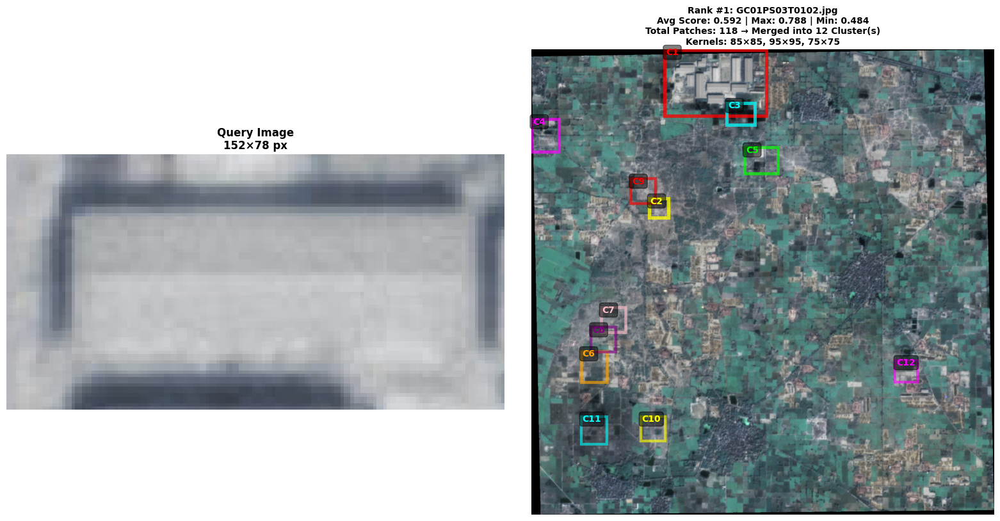

Saved: clustered_07_rank2_GC01PS03T0052.png


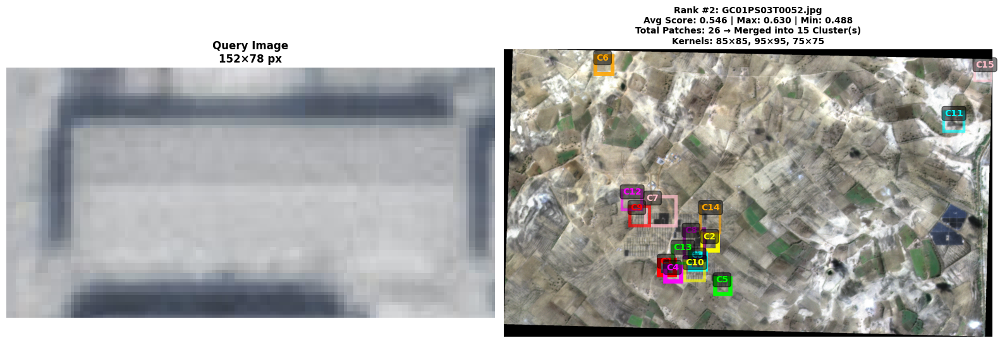

Saved: clustered_07_rank3_GC01PS03D0002.png


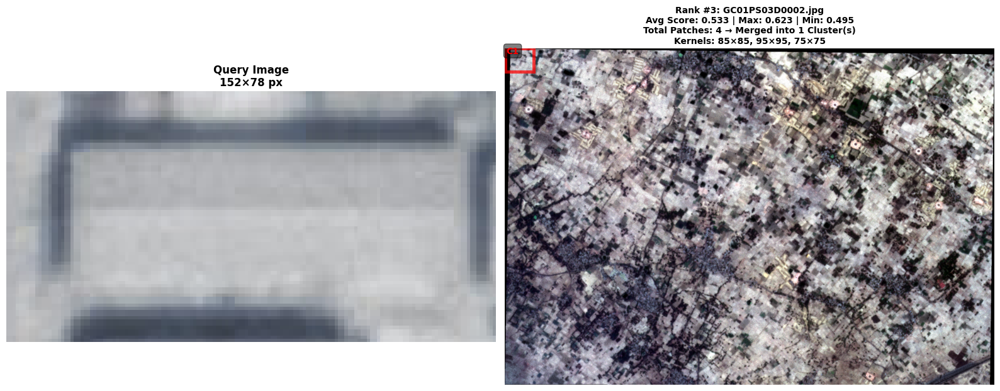

Saved: clustered_07_rank4_GC01PS03T0051.png


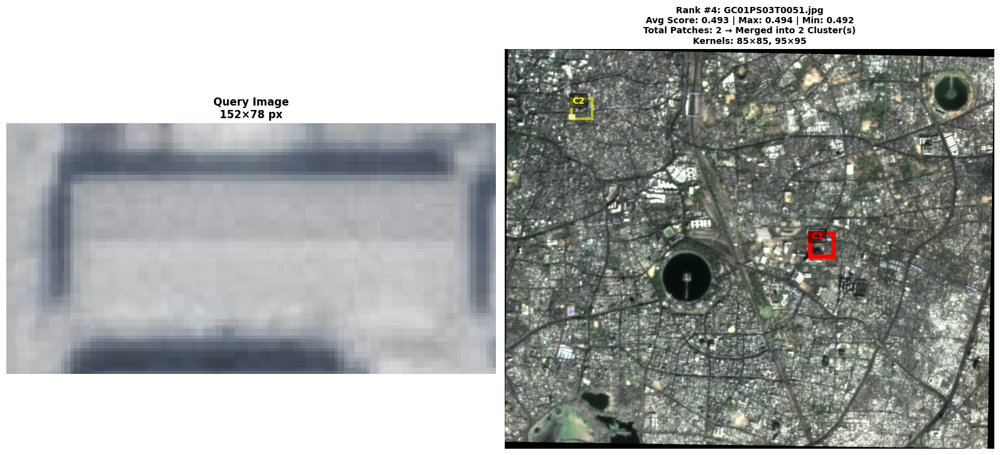

✅ Displayed top 4 images with merged clusters

QUERY COMPLETE!
Query image: 07.png
Total matches found: 150
Unique images found: 4
Total patches: 150 → Merged into 30 clusters

Top 5 Images (by Avg Score) with Merged Clusters:
  1. GC01PS03T0102.jpg
     - Patches: 118 → 12 cluster(s)
     - Avg Score: 0.592, Max: 0.788
       Cluster 1: 391×255 px (96 patches, avg score: 0.604)
       Cluster 2: 75×75 px (1 patches, avg score: 0.599)
       Cluster 3: 107×85 px (3 patches, avg score: 0.588)
       Cluster 4: 105×125 px (4 patches, avg score: 0.556)
       Cluster 5: 129×101 px (4 patches, avg score: 0.548)
       Cluster 6: 99×119 px (3 patches, avg score: 0.529)
       Cluster 7: 95×95 px (1 patches, avg score: 0.523)
       Cluster 8: 95×95 px (1 patches, avg score: 0.518)
       Cluster 9: 95×95 px (1 patches, avg score: 0.516)
       Cluster 10: 95×95 px (1 patches, avg score: 0.499)
       Cluster 11: 99×107 px (2 patches, avg score: 0.495)
       Cluster 12: 85×85 px (1 patches,

In [13]:
"""
FILE 3: Query and Visualization Script (MODIFIED v4)
==================================================
This file loads pre-trained indexes and merges ONLY overlapping patches into clusters.
Run this after training (File 2).

NEW FEATURE: Shows one rectangle per CLUSTER of overlapping patches (not one giant box).

Usage in Jupyter:
    1. First run: %run 1_model_classes_v4.py
    2. Then execute the cells below
"""

from pathlib import Path
from PIL import Image
import torch

# ==================== CONFIGURATION ====================
# Update these paths for your setup
QUERY_IMAGE_PATH = "/home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder/07.png"
INDEX_PREFIX = "multi_kernel_index"

# Query parameters
COMPRESS_QUERY = False  # Set True to compress query image before searching
COMPRESSION_SIZE = (50, 50)  # Target size if compressing
TOP_K = 50  # Number of results to retrieve per kernel
MERGE_IOU_THRESHOLD = 0.3  # IoU threshold for merging overlapping patches into clusters
QUERY_STRIDE_RATIO = 0.3  # Overlap ratio for query patch extraction

# Visualization options
VISUALIZE_SEPARATE = False  # Show results separately for each kernel
VISUALIZE_COMBINED = False  # Show all kernels in one figure
VISUALIZE_CLUSTERED = True  # NEW: Show merged clusters (one rectangle per overlapping group)

# Display settings
MAX_IMAGES_TO_DISPLAY = 10  # Number of top images to show

# Kernel sizes (must match training)
QUERY_KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]

# Device
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "dinov3"

print("=" * 80)
print("MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - CLUSTERED MERGING (v4)")
print("=" * 80)
print(f"Query Image: {Path(QUERY_IMAGE_PATH).name}")
print(f"Index Prefix: {INDEX_PREFIX}")
print(f"Device: {DEVICE}")
print(f"Top K: {TOP_K}")
print(f"IoU Threshold: {MERGE_IOU_THRESHOLD}")
print(f"Kernel Sizes: {QUERY_KERNEL_SIZES}")
print("=" * 80)


# ==================== STEP 1: VERIFY QUERY IMAGE ====================
print("\n" + "=" * 80)
print("STEP 1: Loading Query Image")
print("=" * 80)

query_path = Path(QUERY_IMAGE_PATH)
if not query_path.exists():
    raise FileNotFoundError(f"Query image not found: {QUERY_IMAGE_PATH}")

with Image.open(QUERY_IMAGE_PATH) as img:
    query_size = img.size
    print(f"✅ Query image loaded: {query_path.name}")
    print(f"   - Size: {query_size[0]}×{query_size[1]} px")
    print(f"   - Mode: {img.mode}")

# Optional compression
if COMPRESS_QUERY:
    compressed_path = str(query_path).replace(
        query_path.suffix, 
        f"_compressed_{COMPRESSION_SIZE[0]}x{COMPRESSION_SIZE[1]}{query_path.suffix}"
    )
    
    with Image.open(QUERY_IMAGE_PATH) as img:
        img_resized = img.resize(COMPRESSION_SIZE, Image.Resampling.LANCZOS)
        img_resized.save(compressed_path)
    
    print(f"✅ Compressed query saved: {Path(compressed_path).name}")
    print(f"   - New size: {COMPRESSION_SIZE[0]}×{COMPRESSION_SIZE[1]} px")
    final_query_path = compressed_path
else:
    final_query_path = QUERY_IMAGE_PATH
    print(f"   - Using original query (no compression)")


# ==================== STEP 2: INITIALIZE SYSTEM ====================
print("\n" + "=" * 80)
print("STEP 2: Initializing Multi-Kernel System")
print("=" * 80)

system = MultiKernelRetrievalSystem(
    model_name=MODEL_NAME,
    kernel_sizes=QUERY_KERNEL_SIZES,
    device=DEVICE,
    batch_size=16
)

print("✅ System initialized")


# ==================== STEP 3: LOAD PRE-TRAINED INDEXES ====================
print("\n" + "=" * 80)
print("STEP 3: Loading Pre-trained Indexes")
print("=" * 80)

system.load_saved_indexes(INDEX_PREFIX)


# ==================== STEP 4: SEARCH WITH ALL KERNELS ====================
print("\n" + "=" * 80)
print("STEP 4: Searching with All Kernel Sizes")
print("=" * 80)

all_results = system.search_all_kernels(
    query_image=final_query_path,
    top_k=TOP_K,
    query_stride_ratio=QUERY_STRIDE_RATIO,
    aggregation="max"
)

# Print summary
print("\n📊 Search Results Summary:")
total_results = 0
for kernel_size, results in all_results.items():
    if results:
        total_results += len(results)
        print(f"  Kernel {kernel_size[0]}×{kernel_size[1]}: {len(results)} matches")
        print(f"    Top-3 scores: {[f'{r.similarity_score:.3f}' for r in results[:3]]}")

if total_results == 0:
    print("⚠️  No results found! Check if indexes were loaded correctly.")
    import sys
    sys.exit(1)


# ==================== STEP 5a: NEW - VISUALIZE WITH MERGED CLUSTERS ====================
if VISUALIZE_CLUSTERED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5a: NEW - Visualizing Merged Clusters (Overlapping Patches Only)")
    print("=" * 80)
    
    images_with_clusters = system.merge_and_visualize_clustered_patches(
        all_results,
        query_image=final_query_path,
        iou_threshold=MERGE_IOU_THRESHOLD,
        max_display=MAX_IMAGES_TO_DISPLAY,
        save_path=f"clustered_{Path(final_query_path).stem}"
    )
    
    print(f"✅ Displayed top {min(MAX_IMAGES_TO_DISPLAY, len(images_with_clusters))} images with merged clusters")


# ==================== STEP 5b: VISUALIZE SEPARATE RESULTS (OPTIONAL) ====================
if VISUALIZE_SEPARATE and all_results:
    print("\n" + "=" * 80)
    print("STEP 5b: Visualizing Separate Results for Each Kernel")
    print("=" * 80)
    
    system.visualize_separate_kernel_results(
        all_results,
        query_image=final_query_path,
        num_display=5,
        save_prefix=f"results_{Path(final_query_path).stem}"
    )
    
    print("✅ Separate visualizations displayed")


# ==================== STEP 5c: VISUALIZE COMBINED RESULTS (OPTIONAL) ====================
if VISUALIZE_COMBINED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5c: Visualizing Combined Results (All Kernels)")
    print("=" * 80)
    
    system.visualize_combined_all_kernels(
        all_results,
        query_image=final_query_path,
        num_display_per_kernel=5,
        save_path=f"combined_all_kernels_{Path(final_query_path).stem}.png"
    )
    
    print("✅ Combined visualization displayed")


# Store results
query_results = {
    'all_results': all_results,
    'images_with_clusters': images_with_clusters if VISUALIZE_CLUSTERED else None,
    'query_path': final_query_path
}


# ==================== FINAL SUMMARY ====================
print("\n" + "=" * 80)
print("QUERY COMPLETE!")
print("=" * 80)
print(f"Query image: {Path(final_query_path).name}")
print(f"Total matches found: {sum(len(r) for r in all_results.values())}")

if VISUALIZE_CLUSTERED and 'images_with_clusters' in query_results:
    images_data = query_results['images_with_clusters']
    if images_data:
        print(f"Unique images found: {len(images_data)}")
        total_patches = sum(img.num_patches for img in images_data)
        total_clusters = sum(img.num_clusters for img in images_data)
        print(f"Total patches: {total_patches} → Merged into {total_clusters} clusters")
        
        print(f"\nTop 5 Images (by Avg Score) with Merged Clusters:")
        for i, img_data in enumerate(images_data[:5], 1):
            print(f"  {i}. {Path(img_data.image_path).name}")
            print(f"     - Patches: {img_data.num_patches} → {img_data.num_clusters} cluster(s)")
            print(f"     - Avg Score: {img_data.avg_score:.3f}, Max: {img_data.max_score:.3f}")
            
            # Show cluster details
            for cidx, cluster in enumerate(img_data.merged_clusters, 1):
                print(f"       Cluster {cidx}: {cluster.width}×{cluster.height} px "
                      f"({len(cluster.contributing_patches)} patches, "
                      f"avg score: {cluster.avg_score:.3f})")

print("\n" + "=" * 80)
print("All visualizations displayed!")
print("Results stored in 'query_results' variable for further analysis.")
print("=" * 80)


# ==================== OPTIONAL: ACCESS INDIVIDUAL RESULTS ====================
print("\n" + "=" * 80)
print("ACCESSING RESULTS")
print("=" * 80)
print("\nYou can access results using:")
print("  - query_results['all_results']: Dictionary of results per kernel")
print("  - query_results['images_with_clusters']: List of images with merged clusters")
print("  - query_results['query_path']: Path to query image used")
print("\nExample - Access images sorted by avg score:")
print("  images = query_results['images_with_clusters']")
print("  if images:")
print("      top_image = images[0]")
print("      print(f'Top image: {top_image.image_path}')")
print("      print(f'Avg score: {top_image.avg_score:.3f}')")
print("      print(f'Number of clusters: {top_image.num_clusters}')")
print("      for cluster in top_image.merged_clusters:")
print("          print(f'  Cluster: {cluster.width}×{cluster.height} px')")
print("\nExample - Get all clusters for top image:")
print("  if images:")
print("      for cidx, cluster in enumerate(images[0].merged_clusters, 1):")
print("          print(f'Cluster {cidx}:')")
print("          print(f'  BBox: ({cluster.x_min}, {cluster.y_min}) to ({cluster.x_max}, {cluster.y_max})')")
print("          print(f'  Patches in cluster: {len(cluster.contributing_patches)}')")
print("          print(f'  Avg score: {cluster.avg_score:.3f}')")
print("=" * 80)


# ==================== COMPARISON STATISTICS ====================
if VISUALIZE_CLUSTERED and 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    print("\n" + "=" * 80)
    print("DETAILED STATISTICS")
    print("=" * 80)
    
    images_data= query_results['images_with_clusters']
    
    # Overall statistics
    total_unique_images = len(images_data)
    total_patches = sum(img.num_patches for img in images_data)
    total_clusters = sum(img.num_clusters for img in images_data)
    avg_patches_per_image = total_patches / total_unique_images if total_unique_images > 0 else 0
    avg_clusters_per_image = total_clusters / total_unique_images if total_unique_images > 0 else 0
    
    print(f"\n📊 Overall Statistics:")
    print(f"  - Total unique images: {total_unique_images}")
    print(f"  - Total patches: {total_patches}")
    print(f"  - Total merged clusters: {total_clusters}")
    print(f"  - Avg patches per image: {avg_patches_per_image:.1f}")
    print(f"  - Avg clusters per image: {avg_clusters_per_image:.1f}")
    print(f"  - Compression ratio: {total_patches}/{total_clusters} = {total_patches/total_clusters:.1f}x")
    
    # Score distribution
    all_avg_scores = [img.avg_score for img in images_data]
    all_max_scores = [img.max_score for img in images_data]
    
    print(f"\n📈 Score Distribution:")
    print(f"  - Avg score range: {min(all_avg_scores):.3f} to {max(all_avg_scores):.3f}")
    print(f"  - Max score range: {min(all_max_scores):.3f} to {max(all_max_scores):.3f}")
    print(f"  - Mean avg score: {np.mean(all_avg_scores):.3f}")
    print(f"  - Mean max score: {np.mean(all_max_scores):.3f}")
    
    # Cluster size distribution
    all_cluster_sizes = []
    all_cluster_patch_counts = []
    for img in images_data:
        for cluster in img.merged_clusters:
            all_cluster_sizes.append(cluster.width * cluster.height)
            all_cluster_patch_counts.append(len(cluster.contributing_patches))
    
    print(f"\n📐 Cluster Statistics:")
    print(f"  - Total clusters: {len(all_cluster_sizes)}")
    print(f"  - Avg cluster size: {np.mean(all_cluster_sizes):.0f} px²")
    print(f"  - Min cluster size: {min(all_cluster_sizes)} px²")
    print(f"  - Max cluster size: {max(all_cluster_sizes)} px²")
    print(f"  - Avg patches per cluster: {np.mean(all_cluster_patch_counts):.1f}")
    print(f"  - Max patches per cluster: {max(all_cluster_patch_counts)}")
    
    # Cluster count distribution
    from collections import Counter
    cluster_counts = Counter([img.num_clusters for img in images_data])
    print(f"\n🔢 Cluster Count Distribution:")
    for count, freq in sorted(cluster_counts.items()):
        percentage = (freq / total_unique_images) * 100
        print(f"  - {count} cluster(s): {freq} images ({percentage:.1f}%)")
    
    # Kernel size distribution
    kernel_usage = Counter()
    for img in images_data:
        for kernel in img.kernel_sizes:
            kernel_usage[kernel] += 1
    
    print(f"\n🔍 Kernel Size Usage:")
    for kernel, count in sorted(kernel_usage.items()):
        percentage = (count / total_unique_images) * 100
        print(f"  - {kernel[0]}×{kernel[1]}: {count} images ({percentage:.1f}%)")
    
    # Top performers
    print(f"\n🏆 Top 10 Images by Average Score (with Cluster Details):")
    for i, img_data in enumerate(images_data[:10], 1):
        kernels_str = ', '.join([f"{k[0]}×{k[1]}" for k in img_data.kernel_sizes])
        print(f"  {i}. {Path(img_data.image_path).name}")
        print(f"     Avg: {img_data.avg_score:.3f} | Max: {img_data.max_score:.3f} | "
              f"Patches: {img_data.num_patches} → {img_data.num_clusters} cluster(s)")
        print(f"     Kernels: [{kernels_str}]")
        
        # Show cluster details
        for cidx, cluster in enumerate(img_data.merged_clusters, 1):
            print(f"       Cluster {cidx}: {cluster.width}×{cluster.height} px, "
                  f"{len(cluster.contributing_patches)} patches, "
                  f"avg={cluster.avg_score:.3f}")
    
    print("=" * 80)


# ==================== EXPORT RESULTS (OPTIONAL) ====================
print("\n" + "=" * 80)
print("EXPORT OPTIONS")
print("=" * 80)
print("\nTo export results to JSON:")
print("""
import json

# Export image rankings with merged clusters
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    export_data = []
    for rank, img in enumerate(query_results['images_with_clusters'], 1):
        clusters_data = []
        for cidx, cluster in enumerate(img.merged_clusters, 1):
            clusters_data.append({
                'cluster_id': cidx,
                'bbox': {
                    'x_min': int(cluster.x_min),
                    'y_min': int(cluster.y_min),
                    'x_max': int(cluster.x_max),
                    'y_max': int(cluster.y_max),
                    'width': int(cluster.width),
                    'height': int(cluster.height)
                },
                'num_patches': len(cluster.contributing_patches),
                'avg_score': float(cluster.avg_score),
                'max_score': float(cluster.max_score),
                'kernel_sizes': [list(k) for k in cluster.kernel_sizes]
            })
        
        export_data.append({
            'rank': rank,
            'image_path': img.image_path,
            'num_patches': img.num_patches,
            'num_clusters': img.num_clusters,
            'avg_score': float(img.avg_score),
            'max_score': float(img.max_score),
            'min_score': float(img.min_score),
            'clusters': clusters_data,
            'kernel_sizes': [list(k) for k in img.kernel_sizes]
        })
    
    with open('results_clustered_ranking.json', 'w') as f:
        json.dump(export_data, f, indent=2)
    
    print("✅ Results exported to results_clustered_ranking.json")
""")

print("\nTo save all visualizations:")
print("""
# Run visualization with save_path
images_with_clusters = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=MERGE_IOU_THRESHOLD,
    max_display=20,
    save_path="output/my_clustered_results"
)
""")

print("\nTo extract all cluster regions from an image:")
print("""
import cv2
import matplotlib.pyplot as plt

# Get top image
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    top_img = query_results['images_with_clusters'][0]
    
    # Load image
    img = cv2.imread(top_img.image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Extract each cluster
    fig, axes = plt.subplots(1, len(top_img.merged_clusters), figsize=(5*len(top_img.merged_clusters), 5))
    if len(top_img.merged_clusters) == 1:
        axes = [axes]
    
    for idx, cluster in enumerate(top_img.merged_clusters):
        x_min, y_min = cluster.x_min, cluster.y_min
        x_max, y_max = cluster.x_max, cluster.y_max
        
        extracted_region = img[y_min:y_max, x_min:x_max]
        
        axes[idx].imshow(extracted_region)
        axes[idx].set_title(f"Cluster {idx+1}\\n{cluster.width}×{cluster.height} px\\n"
                          f"{len(cluster.contributing_patches)} patches\\n"
                          f"Score: {cluster.avg_score:.3f}")
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Extracted {len(top_img.merged_clusters)} cluster regions")
""")

print("=" * 80)
print("\n✅ Script complete! Use the examples above to explore your results.")
print("=" * 80)


# ==================== SUMMARY OF CHANGES ====================
print("\n" + "=" * 80)
print("🎉 NEW FEATURES IN v4 - CLUSTERED MERGING")
print("=" * 80)
print("""
✨ What's New:
  1. INTELLIGENT CLUSTER MERGING
     - Only overlapping patches are merged together
     - Creates separate rectangles for distinct regions
     - Uses Union-Find algorithm for efficient clustering
  
  2. Multiple rectangles per image
     - Each cluster of overlapping patches gets ONE rectangle
     - Non-overlapping patches remain as separate clusters
     - Much clearer visualization than single giant box
  
  3. Cluster-level statistics
     - Number of patches per cluster
     - Size of each merged region
     - Individual cluster scores
     - Compression ratio (patches → clusters)

💡 Key Improvements:
  - merge_and_visualize_clustered_patches(): Main method
  - group_patches_by_image_with_clusters(): Creates clusters per image
  - visualize_images_with_merged_clusters(): Shows all clusters
  - ImageWithMergedPatches: Contains list of merged_clusters

📊 Visual Features:
  - Each cluster labeled with C1, C2, C3, etc.
  - Different colors for different clusters
  - Line thickness/alpha based on cluster score
  - Cluster count shown in title

🔧 Configuration:
  Set MERGE_IOU_THRESHOLD to control cluster merging (0.3 recommended)
  Higher values = stricter overlap requirement = more clusters
  Lower values = looser overlap = fewer, larger clusters

📈 Example Output:
  Image with 15 patches might become:
    - 3 clusters in one region (overlapping)
    - 2 clusters in another region (overlapping)
    - 1 isolated patch (no overlap)
  Total: 6 rectangles instead of 1 giant box or 15 individual boxes
""")
print("=" * 80)


# ==================== ADVANCED ANALYSIS ====================
print("\n" + "=" * 80)
print("ADVANCED ANALYSIS EXAMPLES")
print("=" * 80)
print("""
# Find images with most clusters (indicating multiple distinct regions)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    images = query_results['images_with_clusters']
    
    # Sort by number of clusters
    by_clusters = sorted(images, key=lambda x: x.num_clusters, reverse=True)
    
    print("\\nImages with most clusters (multiple distinct matching regions):")
    for img in by_clusters[:5]:
        print(f"  {Path(img.image_path).name}: {img.num_clusters} clusters from {img.num_patches} patches")

# Find largest clusters (most concentrated matches)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    all_clusters = []
    for img in query_results['images_with_clusters']:
        for cluster in img.merged_clusters:
            all_clusters.append((img.image_path, cluster))
    
    # Sort by number of contributing patches
    by_density = sorted(all_clusters, key=lambda x: len(x[1].contributing_patches), reverse=True)
    
    print("\\nMost dense clusters (most patches merged):")
    for img_path, cluster in by_density[:5]:
        print(f"  {Path(img_path).name}:")
        print(f"    {len(cluster.contributing_patches)} patches in {cluster.width}×{cluster.height} px")
        print(f"    Avg score: {cluster.avg_score:.3f}")

# Find best isolated matches (single high-scoring clusters)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    single_cluster_images = [img for img in query_results['images_with_clusters'] if img.num_clusters == 1]
    single_cluster_images.sort(key=lambda x: x.avg_score, reverse=True)
    
    print("\\nBest isolated matches (images with single cluster):")
    for img in single_cluster_images[:5]:
        cluster = img.merged_clusters[0]
        print(f"  {Path(img.image_path).name}:")
        print(f"    Score: {img.avg_score:.3f}, Size: {cluster.width}×{cluster.height} px")
        print(f"    Patches: {img.num_patches}")
""")
print("=" * 80)


# ==================== VISUALIZATION CUSTOMIZATION ====================
print("\n" + "=" * 80)
print("VISUALIZATION CUSTOMIZATION")
print("=" * 80)
print("""
# Adjust IoU threshold to control merging behavior:

# Stricter merging (more clusters, smaller boxes):
images_strict = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=0.5,  # Higher = stricter
    max_display=10
)

# Looser merging (fewer clusters, larger boxes):
images_loose = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=0.1,  # Lower = looser
    max_display=10
)

# Compare the difference:
print(f"Strict (IoU=0.5): {sum(img.num_clusters for img in images_strict)} total clusters")
print(f"Loose (IoU=0.1): {sum(img.num_clusters for img in images_loose)} total clusters")
""")
print("=" * 80)

print("\n✅ All done! Enjoy your clustered patch visualization!")

MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - CLUSTERED MERGING (v4)
Query Image: 05.png
Index Prefix: multi_kernel_index
Device: cuda
Top K: 50
IoU Threshold: 0.3
Kernel Sizes: [(75, 75), (85, 85), (95, 95)]

STEP 1: Loading Query Image
✅ Query image loaded: 05.png
   - Size: 250×238 px
   - Mode: RGBA
   - Using original query (no compression)

STEP 2: Initializing Multi-Kernel System
Loading DINOv3 model: facebook/dinov3-vitb16-pretrain-lvd1689m
DINOv3 model loaded. Hidden size: 768
✅ System initialized

STEP 3: Loading Pre-trained Indexes

📂 Loading pre-computed indexes from: multi_kernel_index
  ✓ Loaded kernel 75×75: 21510 patches
  ✓ Loaded kernel 85×85: 16533 patches
  ✓ Loaded kernel 95×95: 13249 patches

STEP 4: Searching with All Kernel Sizes

Searching with all kernel sizes

🔍 Searching with kernel 75×75...
  ✅ Found 50 results. Top score: 0.9662

🔍 Searching with kernel 85×85...
  ✅ Found 50 results. Top score: 0.9619

🔍 Searching with kernel 95×95...
  ✅ Found 50 results. Top 

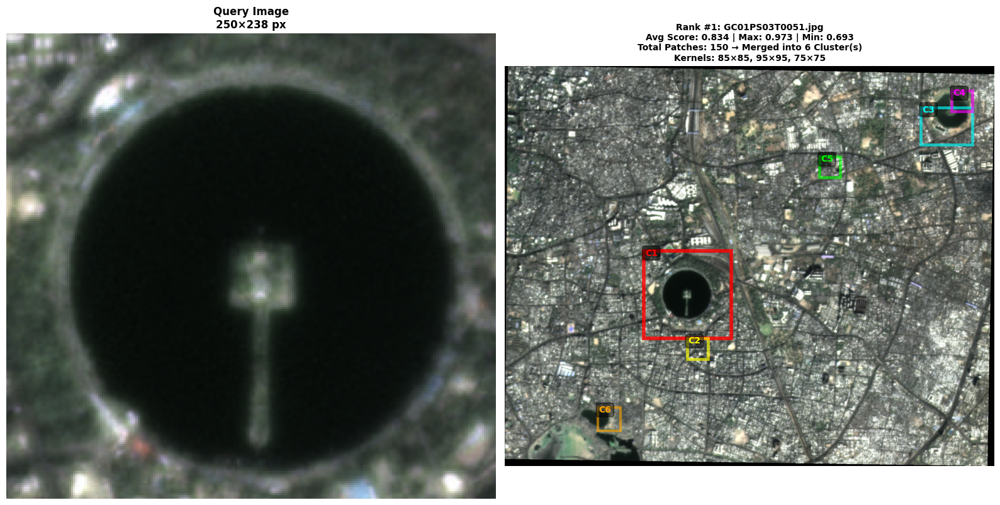

✅ Displayed top 1 images with merged clusters

QUERY COMPLETE!
Query image: 05.png
Total matches found: 150
Unique images found: 1
Total patches: 150 → Merged into 6 clusters

Top 5 Images (by Avg Score) with Merged Clusters:
  1. GC01PS03T0051.jpg
     - Patches: 150 → 6 cluster(s)
     - Avg Score: 0.834, Max: 0.973
       Cluster 1: 361×361 px (137 patches, avg score: 0.844)
       Cluster 2: 85×85 px (1 patches, avg score: 0.744)
       Cluster 3: 211×153 px (9 patches, avg score: 0.734)
       Cluster 4: 85×85 px (1 patches, avg score: 0.733)
       Cluster 5: 85×85 px (1 patches, avg score: 0.729)
       Cluster 6: 95×95 px (1 patches, avg score: 0.693)

All visualizations displayed!
Results stored in 'query_results' variable for further analysis.

ACCESSING RESULTS

You can access results using:
  - query_results['all_results']: Dictionary of results per kernel
  - query_results['images_with_clusters']: List of images with merged clusters
  - query_results['query_path']: Path to

In [14]:
"""
FILE 3: Query and Visualization Script (MODIFIED v4)
==================================================
This file loads pre-trained indexes and merges ONLY overlapping patches into clusters.
Run this after training (File 2).

NEW FEATURE: Shows one rectangle per CLUSTER of overlapping patches (not one giant box).

Usage in Jupyter:
    1. First run: %run 1_model_classes_v4.py
    2. Then execute the cells below
"""

from pathlib import Path
from PIL import Image
import torch

# ==================== CONFIGURATION ====================
# Update these paths for your setup
QUERY_IMAGE_PATH = "/home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder/05.png"
INDEX_PREFIX = "multi_kernel_index"

# Query parameters
COMPRESS_QUERY = False  # Set True to compress query image before searching
COMPRESSION_SIZE = (50, 50)  # Target size if compressing
TOP_K = 50  # Number of results to retrieve per kernel
MERGE_IOU_THRESHOLD = 0.3  # IoU threshold for merging overlapping patches into clusters
QUERY_STRIDE_RATIO = 0.3  # Overlap ratio for query patch extraction

# Visualization options
VISUALIZE_SEPARATE = False  # Show results separately for each kernel
VISUALIZE_COMBINED = False  # Show all kernels in one figure
VISUALIZE_CLUSTERED = True  # NEW: Show merged clusters (one rectangle per overlapping group)

# Display settings
MAX_IMAGES_TO_DISPLAY = 10  # Number of top images to show

# Kernel sizes (must match training)
QUERY_KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]

# Device
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "dinov3"

print("=" * 80)
print("MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - CLUSTERED MERGING (v4)")
print("=" * 80)
print(f"Query Image: {Path(QUERY_IMAGE_PATH).name}")
print(f"Index Prefix: {INDEX_PREFIX}")
print(f"Device: {DEVICE}")
print(f"Top K: {TOP_K}")
print(f"IoU Threshold: {MERGE_IOU_THRESHOLD}")
print(f"Kernel Sizes: {QUERY_KERNEL_SIZES}")
print("=" * 80)


# ==================== STEP 1: VERIFY QUERY IMAGE ====================
print("\n" + "=" * 80)
print("STEP 1: Loading Query Image")
print("=" * 80)

query_path = Path(QUERY_IMAGE_PATH)
if not query_path.exists():
    raise FileNotFoundError(f"Query image not found: {QUERY_IMAGE_PATH}")

with Image.open(QUERY_IMAGE_PATH) as img:
    query_size = img.size
    print(f"✅ Query image loaded: {query_path.name}")
    print(f"   - Size: {query_size[0]}×{query_size[1]} px")
    print(f"   - Mode: {img.mode}")

# Optional compression
if COMPRESS_QUERY:
    compressed_path = str(query_path).replace(
        query_path.suffix, 
        f"_compressed_{COMPRESSION_SIZE[0]}x{COMPRESSION_SIZE[1]}{query_path.suffix}"
    )
    
    with Image.open(QUERY_IMAGE_PATH) as img:
        img_resized = img.resize(COMPRESSION_SIZE, Image.Resampling.LANCZOS)
        img_resized.save(compressed_path)
    
    print(f"✅ Compressed query saved: {Path(compressed_path).name}")
    print(f"   - New size: {COMPRESSION_SIZE[0]}×{COMPRESSION_SIZE[1]} px")
    final_query_path = compressed_path
else:
    final_query_path = QUERY_IMAGE_PATH
    print(f"   - Using original query (no compression)")


# ==================== STEP 2: INITIALIZE SYSTEM ====================
print("\n" + "=" * 80)
print("STEP 2: Initializing Multi-Kernel System")
print("=" * 80)

system = MultiKernelRetrievalSystem(
    model_name=MODEL_NAME,
    kernel_sizes=QUERY_KERNEL_SIZES,
    device=DEVICE,
    batch_size=16
)

print("✅ System initialized")


# ==================== STEP 3: LOAD PRE-TRAINED INDEXES ====================
print("\n" + "=" * 80)
print("STEP 3: Loading Pre-trained Indexes")
print("=" * 80)

system.load_saved_indexes(INDEX_PREFIX)


# ==================== STEP 4: SEARCH WITH ALL KERNELS ====================
print("\n" + "=" * 80)
print("STEP 4: Searching with All Kernel Sizes")
print("=" * 80)

all_results = system.search_all_kernels(
    query_image=final_query_path,
    top_k=TOP_K,
    query_stride_ratio=QUERY_STRIDE_RATIO,
    aggregation="max"
)

# Print summary
print("\n📊 Search Results Summary:")
total_results = 0
for kernel_size, results in all_results.items():
    if results:
        total_results += len(results)
        print(f"  Kernel {kernel_size[0]}×{kernel_size[1]}: {len(results)} matches")
        print(f"    Top-3 scores: {[f'{r.similarity_score:.3f}' for r in results[:3]]}")

if total_results == 0:
    print("⚠️  No results found! Check if indexes were loaded correctly.")
    import sys
    sys.exit(1)


# ==================== STEP 5a: NEW - VISUALIZE WITH MERGED CLUSTERS ====================
if VISUALIZE_CLUSTERED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5a: NEW - Visualizing Merged Clusters (Overlapping Patches Only)")
    print("=" * 80)
    
    images_with_clusters = system.merge_and_visualize_clustered_patches(
        all_results,
        query_image=final_query_path,
        iou_threshold=MERGE_IOU_THRESHOLD,
        max_display=MAX_IMAGES_TO_DISPLAY,
        save_path=f"clustered_{Path(final_query_path).stem}"
    )
    
    print(f"✅ Displayed top {min(MAX_IMAGES_TO_DISPLAY, len(images_with_clusters))} images with merged clusters")


# ==================== STEP 5b: VISUALIZE SEPARATE RESULTS (OPTIONAL) ====================
if VISUALIZE_SEPARATE and all_results:
    print("\n" + "=" * 80)
    print("STEP 5b: Visualizing Separate Results for Each Kernel")
    print("=" * 80)
    
    system.visualize_separate_kernel_results(
        all_results,
        query_image=final_query_path,
        num_display=5,
        save_prefix=f"results_{Path(final_query_path).stem}"
    )
    
    print("✅ Separate visualizations displayed")


# ==================== STEP 5c: VISUALIZE COMBINED RESULTS (OPTIONAL) ====================
if VISUALIZE_COMBINED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5c: Visualizing Combined Results (All Kernels)")
    print("=" * 80)
    
    system.visualize_combined_all_kernels(
        all_results,
        query_image=final_query_path,
        num_display_per_kernel=5,
        save_path=f"combined_all_kernels_{Path(final_query_path).stem}.png"
    )
    
    print("✅ Combined visualization displayed")


# Store results
query_results = {
    'all_results': all_results,
    'images_with_clusters': images_with_clusters if VISUALIZE_CLUSTERED else None,
    'query_path': final_query_path
}


# ==================== FINAL SUMMARY ====================
print("\n" + "=" * 80)
print("QUERY COMPLETE!")
print("=" * 80)
print(f"Query image: {Path(final_query_path).name}")
print(f"Total matches found: {sum(len(r) for r in all_results.values())}")

if VISUALIZE_CLUSTERED and 'images_with_clusters' in query_results:
    images_data = query_results['images_with_clusters']
    if images_data:
        print(f"Unique images found: {len(images_data)}")
        total_patches = sum(img.num_patches for img in images_data)
        total_clusters = sum(img.num_clusters for img in images_data)
        print(f"Total patches: {total_patches} → Merged into {total_clusters} clusters")
        
        print(f"\nTop 5 Images (by Avg Score) with Merged Clusters:")
        for i, img_data in enumerate(images_data[:5], 1):
            print(f"  {i}. {Path(img_data.image_path).name}")
            print(f"     - Patches: {img_data.num_patches} → {img_data.num_clusters} cluster(s)")
            print(f"     - Avg Score: {img_data.avg_score:.3f}, Max: {img_data.max_score:.3f}")
            
            # Show cluster details
            for cidx, cluster in enumerate(img_data.merged_clusters, 1):
                print(f"       Cluster {cidx}: {cluster.width}×{cluster.height} px "
                      f"({len(cluster.contributing_patches)} patches, "
                      f"avg score: {cluster.avg_score:.3f})")

print("\n" + "=" * 80)
print("All visualizations displayed!")
print("Results stored in 'query_results' variable for further analysis.")
print("=" * 80)


# ==================== OPTIONAL: ACCESS INDIVIDUAL RESULTS ====================
print("\n" + "=" * 80)
print("ACCESSING RESULTS")
print("=" * 80)
print("\nYou can access results using:")
print("  - query_results['all_results']: Dictionary of results per kernel")
print("  - query_results['images_with_clusters']: List of images with merged clusters")
print("  - query_results['query_path']: Path to query image used")
print("\nExample - Access images sorted by avg score:")
print("  images = query_results['images_with_clusters']")
print("  if images:")
print("      top_image = images[0]")
print("      print(f'Top image: {top_image.image_path}')")
print("      print(f'Avg score: {top_image.avg_score:.3f}')")
print("      print(f'Number of clusters: {top_image.num_clusters}')")
print("      for cluster in top_image.merged_clusters:")
print("          print(f'  Cluster: {cluster.width}×{cluster.height} px')")
print("\nExample - Get all clusters for top image:")
print("  if images:")
print("      for cidx, cluster in enumerate(images[0].merged_clusters, 1):")
print("          print(f'Cluster {cidx}:')")
print("          print(f'  BBox: ({cluster.x_min}, {cluster.y_min}) to ({cluster.x_max}, {cluster.y_max})')")
print("          print(f'  Patches in cluster: {len(cluster.contributing_patches)}')")
print("          print(f'  Avg score: {cluster.avg_score:.3f}')")
print("=" * 80)


# ==================== COMPARISON STATISTICS ====================
if VISUALIZE_CLUSTERED and 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    print("\n" + "=" * 80)
    print("DETAILED STATISTICS")
    print("=" * 80)
    
    images_data= query_results['images_with_clusters']
    
    # Overall statistics
    total_unique_images = len(images_data)
    total_patches = sum(img.num_patches for img in images_data)
    total_clusters = sum(img.num_clusters for img in images_data)
    avg_patches_per_image = total_patches / total_unique_images if total_unique_images > 0 else 0
    avg_clusters_per_image = total_clusters / total_unique_images if total_unique_images > 0 else 0
    
    print(f"\n📊 Overall Statistics:")
    print(f"  - Total unique images: {total_unique_images}")
    print(f"  - Total patches: {total_patches}")
    print(f"  - Total merged clusters: {total_clusters}")
    print(f"  - Avg patches per image: {avg_patches_per_image:.1f}")
    print(f"  - Avg clusters per image: {avg_clusters_per_image:.1f}")
    print(f"  - Compression ratio: {total_patches}/{total_clusters} = {total_patches/total_clusters:.1f}x")
    
    # Score distribution
    all_avg_scores = [img.avg_score for img in images_data]
    all_max_scores = [img.max_score for img in images_data]
    
    print(f"\n📈 Score Distribution:")
    print(f"  - Avg score range: {min(all_avg_scores):.3f} to {max(all_avg_scores):.3f}")
    print(f"  - Max score range: {min(all_max_scores):.3f} to {max(all_max_scores):.3f}")
    print(f"  - Mean avg score: {np.mean(all_avg_scores):.3f}")
    print(f"  - Mean max score: {np.mean(all_max_scores):.3f}")
    
    # Cluster size distribution
    all_cluster_sizes = []
    all_cluster_patch_counts = []
    for img in images_data:
        for cluster in img.merged_clusters:
            all_cluster_sizes.append(cluster.width * cluster.height)
            all_cluster_patch_counts.append(len(cluster.contributing_patches))
    
    print(f"\n📐 Cluster Statistics:")
    print(f"  - Total clusters: {len(all_cluster_sizes)}")
    print(f"  - Avg cluster size: {np.mean(all_cluster_sizes):.0f} px²")
    print(f"  - Min cluster size: {min(all_cluster_sizes)} px²")
    print(f"  - Max cluster size: {max(all_cluster_sizes)} px²")
    print(f"  - Avg patches per cluster: {np.mean(all_cluster_patch_counts):.1f}")
    print(f"  - Max patches per cluster: {max(all_cluster_patch_counts)}")
    
    # Cluster count distribution
    from collections import Counter
    cluster_counts = Counter([img.num_clusters for img in images_data])
    print(f"\n🔢 Cluster Count Distribution:")
    for count, freq in sorted(cluster_counts.items()):
        percentage = (freq / total_unique_images) * 100
        print(f"  - {count} cluster(s): {freq} images ({percentage:.1f}%)")
    
    # Kernel size distribution
    kernel_usage = Counter()
    for img in images_data:
        for kernel in img.kernel_sizes:
            kernel_usage[kernel] += 1
    
    print(f"\n🔍 Kernel Size Usage:")
    for kernel, count in sorted(kernel_usage.items()):
        percentage = (count / total_unique_images) * 100
        print(f"  - {kernel[0]}×{kernel[1]}: {count} images ({percentage:.1f}%)")
    
    # Top performers
    print(f"\n🏆 Top 10 Images by Average Score (with Cluster Details):")
    for i, img_data in enumerate(images_data[:10], 1):
        kernels_str = ', '.join([f"{k[0]}×{k[1]}" for k in img_data.kernel_sizes])
        print(f"  {i}. {Path(img_data.image_path).name}")
        print(f"     Avg: {img_data.avg_score:.3f} | Max: {img_data.max_score:.3f} | "
              f"Patches: {img_data.num_patches} → {img_data.num_clusters} cluster(s)")
        print(f"     Kernels: [{kernels_str}]")
        
        # Show cluster details
        for cidx, cluster in enumerate(img_data.merged_clusters, 1):
            print(f"       Cluster {cidx}: {cluster.width}×{cluster.height} px, "
                  f"{len(cluster.contributing_patches)} patches, "
                  f"avg={cluster.avg_score:.3f}")
    
    print("=" * 80)


# ==================== EXPORT RESULTS (OPTIONAL) ====================
print("\n" + "=" * 80)
print("EXPORT OPTIONS")
print("=" * 80)
print("\nTo export results to JSON:")
print("""
import json

# Export image rankings with merged clusters
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    export_data = []
    for rank, img in enumerate(query_results['images_with_clusters'], 1):
        clusters_data = []
        for cidx, cluster in enumerate(img.merged_clusters, 1):
            clusters_data.append({
                'cluster_id': cidx,
                'bbox': {
                    'x_min': int(cluster.x_min),
                    'y_min': int(cluster.y_min),
                    'x_max': int(cluster.x_max),
                    'y_max': int(cluster.y_max),
                    'width': int(cluster.width),
                    'height': int(cluster.height)
                },
                'num_patches': len(cluster.contributing_patches),
                'avg_score': float(cluster.avg_score),
                'max_score': float(cluster.max_score),
                'kernel_sizes': [list(k) for k in cluster.kernel_sizes]
            })
        
        export_data.append({
            'rank': rank,
            'image_path': img.image_path,
            'num_patches': img.num_patches,
            'num_clusters': img.num_clusters,
            'avg_score': float(img.avg_score),
            'max_score': float(img.max_score),
            'min_score': float(img.min_score),
            'clusters': clusters_data,
            'kernel_sizes': [list(k) for k in img.kernel_sizes]
        })
    
    with open('results_clustered_ranking.json', 'w') as f:
        json.dump(export_data, f, indent=2)
    
    print("✅ Results exported to results_clustered_ranking.json")
""")

print("\nTo save all visualizations:")
print("""
# Run visualization with save_path
images_with_clusters = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=MERGE_IOU_THRESHOLD,
    max_display=20,
    save_path="output/my_clustered_results"
)
""")

print("\nTo extract all cluster regions from an image:")
print("""
import cv2
import matplotlib.pyplot as plt

# Get top image
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    top_img = query_results['images_with_clusters'][0]
    
    # Load image
    img = cv2.imread(top_img.image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Extract each cluster
    fig, axes = plt.subplots(1, len(top_img.merged_clusters), figsize=(5*len(top_img.merged_clusters), 5))
    if len(top_img.merged_clusters) == 1:
        axes = [axes]
    
    for idx, cluster in enumerate(top_img.merged_clusters):
        x_min, y_min = cluster.x_min, cluster.y_min
        x_max, y_max = cluster.x_max, cluster.y_max
        
        extracted_region = img[y_min:y_max, x_min:x_max]
        
        axes[idx].imshow(extracted_region)
        axes[idx].set_title(f"Cluster {idx+1}\\n{cluster.width}×{cluster.height} px\\n"
                          f"{len(cluster.contributing_patches)} patches\\n"
                          f"Score: {cluster.avg_score:.3f}")
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Extracted {len(top_img.merged_clusters)} cluster regions")
""")

print("=" * 80)
print("\n✅ Script complete! Use the examples above to explore your results.")
print("=" * 80)


# ==================== SUMMARY OF CHANGES ====================
print("\n" + "=" * 80)
print("🎉 NEW FEATURES IN v4 - CLUSTERED MERGING")
print("=" * 80)
print("""
✨ What's New:
  1. INTELLIGENT CLUSTER MERGING
     - Only overlapping patches are merged together
     - Creates separate rectangles for distinct regions
     - Uses Union-Find algorithm for efficient clustering
  
  2. Multiple rectangles per image
     - Each cluster of overlapping patches gets ONE rectangle
     - Non-overlapping patches remain as separate clusters
     - Much clearer visualization than single giant box
  
  3. Cluster-level statistics
     - Number of patches per cluster
     - Size of each merged region
     - Individual cluster scores
     - Compression ratio (patches → clusters)

💡 Key Improvements:
  - merge_and_visualize_clustered_patches(): Main method
  - group_patches_by_image_with_clusters(): Creates clusters per image
  - visualize_images_with_merged_clusters(): Shows all clusters
  - ImageWithMergedPatches: Contains list of merged_clusters

📊 Visual Features:
  - Each cluster labeled with C1, C2, C3, etc.
  - Different colors for different clusters
  - Line thickness/alpha based on cluster score
  - Cluster count shown in title

🔧 Configuration:
  Set MERGE_IOU_THRESHOLD to control cluster merging (0.3 recommended)
  Higher values = stricter overlap requirement = more clusters
  Lower values = looser overlap = fewer, larger clusters

📈 Example Output:
  Image with 15 patches might become:
    - 3 clusters in one region (overlapping)
    - 2 clusters in another region (overlapping)
    - 1 isolated patch (no overlap)
  Total: 6 rectangles instead of 1 giant box or 15 individual boxes
""")
print("=" * 80)


# ==================== ADVANCED ANALYSIS ====================
print("\n" + "=" * 80)
print("ADVANCED ANALYSIS EXAMPLES")
print("=" * 80)
print("""
# Find images with most clusters (indicating multiple distinct regions)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    images = query_results['images_with_clusters']
    
    # Sort by number of clusters
    by_clusters = sorted(images, key=lambda x: x.num_clusters, reverse=True)
    
    print("\\nImages with most clusters (multiple distinct matching regions):")
    for img in by_clusters[:5]:
        print(f"  {Path(img.image_path).name}: {img.num_clusters} clusters from {img.num_patches} patches")

# Find largest clusters (most concentrated matches)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    all_clusters = []
    for img in query_results['images_with_clusters']:
        for cluster in img.merged_clusters:
            all_clusters.append((img.image_path, cluster))
    
    # Sort by number of contributing patches
    by_density = sorted(all_clusters, key=lambda x: len(x[1].contributing_patches), reverse=True)
    
    print("\\nMost dense clusters (most patches merged):")
    for img_path, cluster in by_density[:5]:
        print(f"  {Path(img_path).name}:")
        print(f"    {len(cluster.contributing_patches)} patches in {cluster.width}×{cluster.height} px")
        print(f"    Avg score: {cluster.avg_score:.3f}")

# Find best isolated matches (single high-scoring clusters)
if 'images_with_clusters' in query_results and query_results['images_with_clusters']:
    single_cluster_images = [img for img in query_results['images_with_clusters'] if img.num_clusters == 1]
    single_cluster_images.sort(key=lambda x: x.avg_score, reverse=True)
    
    print("\\nBest isolated matches (images with single cluster):")
    for img in single_cluster_images[:5]:
        cluster = img.merged_clusters[0]
        print(f"  {Path(img.image_path).name}:")
        print(f"    Score: {img.avg_score:.3f}, Size: {cluster.width}×{cluster.height} px")
        print(f"    Patches: {img.num_patches}")
""")
print("=" * 80)


# ==================== VISUALIZATION CUSTOMIZATION ====================
print("\n" + "=" * 80)
print("VISUALIZATION CUSTOMIZATION")
print("=" * 80)
print("""
# Adjust IoU threshold to control merging behavior:

# Stricter merging (more clusters, smaller boxes):
images_strict = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=0.5,  # Higher = stricter
    max_display=10
)

# Looser merging (fewer clusters, larger boxes):
images_loose = system.merge_and_visualize_clustered_patches(
    all_results,
    query_image=final_query_path,
    iou_threshold=0.1,  # Lower = looser
    max_display=10
)

# Compare the difference:
print(f"Strict (IoU=0.5): {sum(img.num_clusters for img in images_strict)} total clusters")
print(f"Loose (IoU=0.1): {sum(img.num_clusters for img in images_loose)} total clusters")
""")
print("=" * 80)

print("\n✅ All done! Enjoy your clustered patch visualization!")